# Table of content

## Exercise 6.1

* 1. Loading libraries

* 2. Set Path

* 3. Import libraries

* 4. Checking data
    * 4.1 Merging data
    
* 5. Data wrangling

* 6. Data cleaning
    * 6.1 Check for mixed data types
    * 6.2 Dropping columns
    * 6.3 Find missing values
    * 6.4 Find duplicates
    
* 7. Descriptive statistics

## Exercise 6.2

* 8. Exploratory statistics
    * 8.1 Scatterplot
    * 8.2 Pair-Plot
    * 8.3 Categorial plots
    
* 9. Answering questions   

    * 9.1 Market overview
        * 9.1.1 Listing Distribution
        * 9.1.2 Property type distribution
        * 9.1.3 Room type Distribution
        * 9.1.4 Room type Price mean
        * 9.1.5 Accommodates
        
    * 9.2 Host Analysis
        * 9.2.1 Fraud or professional host?
        * 9.2.2 Verified hosts
        * 9.2.3 Superhost
        
    * 9.3 Price Analysis
    
    * 9.4 Rating and Scores Analysis

* 10. Answers to Questions and Hypothesis 

* 11. Export file

## Exercise 6.3




# 1. Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.pylab as plt
import os
import folium
from folium.plugins import FastMarkerCluster
import json
import scipy
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap 
plt.style.use('ggplot')
pd.set_option('display.max_columns', None)

# 2. Set path

In [2]:
# This command propts matplotlib visuals to appear in the notebook 

%matplotlib inline

In [3]:
path = '/Users/phongsathorn/Documents/Data Analytics/CareerFoundry/Achievement 6'

# 3. Import data

In [4]:

# Read listings data
listings = pd.read_csv(os.path.join(path, '02 Data', 'listings_sum_amsterdam.csv'), index_col="id")

# Read listings details data
listings_details = pd.read_csv(os.path.join(path, '02 Data', 'listings_details_amsterdam.csv'), index_col="id")

# Read calendar data
calendar = pd.read_csv(os.path.join(path, '02 Data', 'calendar_amsterdam.csv'), parse_dates=['date'], index_col='listing_id')

# Read reviews details data
reviews_details = pd.read_csv(os.path.join(path, '02 Data', 'reviews_details_amsterdam.csv'), parse_dates=['date']) #, index_col='id')


/var/folders/dv/_qm6t_j90x5c4lrhz5bm6tb40000gn/T/ipykernel_25849/1069108351.py:5: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  listings_details = pd.read_csv(os.path.join(path, '02 Data', 'listings_details_amsterdam.csv'), index_col="id")


## 4. Check data

In [5]:
listings.shape

(20030, 15)

In [6]:
listings_details.shape

(20030, 95)

In [7]:
listings.dtypes

name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [8]:
 #Print the full list of column names
listings_details.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20030 entries, 2818 to 30580413
Data columns (total 95 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   listing_url                       20030 non-null  object 
 1   scrape_id                         20030 non-null  int64  
 2   last_scraped                      20030 non-null  object 
 3   name                              19992 non-null  object 
 4   summary                           19510 non-null  object 
 5   space                             14579 non-null  object 
 6   description                       19906 non-null  object 
 7   experiences_offered               20030 non-null  object 
 8   neighborhood_overview             13257 non-null  object 
 9   notes                             9031 non-null   object 
 10  transit                           13635 non-null  object 
 11  access                            12227 non-null  object 
 12  int

**Note**
I will only use columns of interest

## 4.1 Data Merging

In [9]:
#creating df

target_columns = ["property_type", "accommodates", "first_review", "review_scores_value", "review_scores_cleanliness", "review_scores_location", "review_scores_accuracy", "review_scores_communication", "review_scores_checkin", "review_scores_rating", "maximum_nights", "host_is_superhost", "host_about", "host_response_time", "host_response_rate", "street", "weekly_price", "monthly_price", "market",'neighbourhood_cleansed','neighbourhood_group_cleansed','host_identity_verified','license','instant_bookable']
listings = pd.merge(listings, listings_details[target_columns], on='id', how='left')
listings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20030 entries, 2818 to 30580413
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            19992 non-null  object 
 1   host_id                         20030 non-null  int64  
 2   host_name                       20026 non-null  object 
 3   neighbourhood_group             0 non-null      float64
 4   neighbourhood                   20030 non-null  object 
 5   latitude                        20030 non-null  float64
 6   longitude                       20030 non-null  float64
 7   room_type                       20030 non-null  object 
 8   price                           20030 non-null  int64  
 9   minimum_nights                  20030 non-null  int64  
 10  number_of_reviews               20030 non-null  int64  
 11  last_review                     17624 non-null  object 
 12  reviews_per_month              

**Note**:
neighbourhood_group is useless

# 5. Data wrangling

In [10]:
#dropping neighbourhood

listings = listings.drop(columns=['neighbourhood_group'])
listings['host_response_rate'] = pd.to_numeric(listings['host_response_rate'].str.strip('%'))

listings.head()

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_is_superhost,host_about,host_response_time,host_response_rate,street,weekly_price,monthly_price,market,neighbourhood_cleansed,neighbourhood_group_cleansed,host_identity_verified,license,instant_bookable
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419,Private room,59,3,248,2018-11-28,2.10,1,44,Apartment,2,2009-03-30,10.0,10.0,9.0,10.0,10.0,10.0,97.0,15,t,"Upon arriving in Amsterdam, one can imagine as...",within an hour,100.0,"Amsterdam, North Holland, Netherlands",NaN,"$1,500.00",Amsterdam,Oostelijk Havengebied - Indische Buurt,NaN,f,NaN,t
3209,"Quiet apt near center, great view",3806,Maartje,Westerpark,52.390225,4.873924,Entire home/apt,160,4,42,2018-08-29,1.03,1,47,Apartment,5,2015-07-31,9.0,9.0,9.0,10.0,10.0,10.0,96.0,20,f,I am a freelance radio producer and journalist...,within an hour,100.0,"Amsterdam, Noord-Holland, Netherlands",$543.00,"$2,000.00",Amsterdam,Westerpark,NaN,t,NaN,f
20168,100%Centre-Studio 1 Private Floor/Bathroom,59484,Alex,Centrum-Oost,52.365087,4.893541,Entire home/apt,80,1,233,2018-11-30,2.18,2,198,Townhouse,2,2010-03-02,9.0,10.0,10.0,9.0,9.0,9.0,87.0,1000,f,Secondary phone nr. + (Phone number hidden by ...,within a few hours,100.0,"Amsterdam, North Holland, Netherlands",NaN,NaN,Amsterdam,Centrum-Oost,NaN,f,NaN,f
25428,Lovely apt in City Centre (Jordaan),56142,Joan,Centrum-West,52.373114,4.883668,Entire home/apt,125,14,1,2018-01-21,0.09,2,141,Apartment,3,2018-01-21,10.0,10.0,10.0,10.0,10.0,10.0,100.0,60,f,"We are a retired couple who live in NYC, and h...",within a few hours,100.0,"Amsterdam, North Holland, Netherlands",$650.00,"$2,000.00",Amsterdam,Centrum-West,NaN,f,NaN,f
27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,Centrum-West,52.386727,4.892078,Private room,150,2,171,2018-11-25,2.03,1,199,Houseboat,2,2012-01-09,10.0,10.0,10.0,10.0,10.0,10.0,99.0,730,t,"Marjan works in ""eye"" the dutch filmmuseum, an...",within an hour,100.0,"Amsterdam, North Holland, Netherlands",$810.00,"$2,500.00",Amsterdam,Centrum-West,NaN,t,NaN,t


In [11]:
# create price per night column

listings['price_per_night']=listings['price']/listings['minimum_nights']

In [12]:

# Create an empty list to store the assigned values
result2 = []

# Loop through each item in the 'license' column
for license in listings['license']:
    # Check if the value is NaN
    if pd.isna(license):
        result2.append('No License')
    # Check if the value is 'EXEMPT'
    elif license == 'EXEMPT':
        result2.append('No Need')
    # For all other cases
    else:
        result2.append('Yes')

# Create 'has_license' column with values from the 'result2' list
listings['has_license'] = result2


In [13]:
### create price_class variable

result3 = []

for value in listings['price_per_night']:
    if value <= 25:
        result3.append('Low price')
    elif 25 < value <= 50:
        result3.append('Mid price')
    elif 50 < value <= 100:
        result3.append('High price')
    elif 100 < value <= 200:
        result3.append('Very high price')
    elif value > 200:
        result3.append('Luxury price')
    else:
        result3.append('Other')

listings['Price_class']=result3

In [14]:
listings.head()

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_is_superhost,host_about,host_response_time,host_response_rate,street,weekly_price,monthly_price,market,neighbourhood_cleansed,neighbourhood_group_cleansed,host_identity_verified,license,instant_bookable,price_per_night,has_license,Price_class
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419,Private room,59,3,248,2018-11-28,2.10,1,44,Apartment,2,2009-03-30,10.0,10.0,9.0,10.0,10.0,10.0,97.0,15,t,"Upon arriving in Amsterdam, one can imagine as...",within an hour,100.0,"Amsterdam, North Holland, Netherlands",NaN,"$1,500.00",Amsterdam,Oostelijk Havengebied - Indische Buurt,NaN,f,NaN,t,19.666667,No License,Low price
3209,"Quiet apt near center, great view",3806,Maartje,Westerpark,52.390225,4.873924,Entire home/apt,160,4,42,2018-08-29,1.03,1,47,Apartment,5,2015-07-31,9.0,9.0,9.0,10.0,10.0,10.0,96.0,20,f,I am a freelance radio producer and journalist...,within an hour,100.0,"Amsterdam, Noord-Holland, Netherlands",$543.00,"$2,000.00",Amsterdam,Westerpark,NaN,t,NaN,f,40.000000,No License,Mid price
20168,100%Centre-Studio 1 Private Floor/Bathroom,59484,Alex,Centrum-Oost,52.365087,4.893541,Entire home/apt,80,1,233,2018-11-30,2.18,2,198,Townhouse,2,2010-03-02,9.0,10.0,10.0,9.0,9.0,9.0,87.0,1000,f,Secondary phone nr. + (Phone number hidden by ...,within a few hours,100.0,"Amsterdam, North Holland, Netherlands",NaN,NaN,Amsterdam,Centrum-Oost,NaN,f,NaN,f,80.000000,No License,High price
25428,Lovely apt in City Centre (Jordaan),56142,Joan,Centrum-West,52.373114,4.883668,Entire home/apt,125,14,1,2018-01-21,0.09,2,141,Apartment,3,2018-01-21,10.0,10.0,10.0,10.0,10.0,10.0,100.0,60,f,"We are a retired couple who live in NYC, and h...",within a few hours,100.0,"Amsterdam, North Holland, Netherlands",$650.00,"$2,000.00",Amsterdam,Centrum-West,NaN,f,NaN,f,8.928571,No License,Low price
27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,Centrum-West,52.386727,4.892078,Private room,150,2,171,2018-11-25,2.03,1,199,Houseboat,2,2012-01-09,10.0,10.0,10.0,10.0,10.0,10.0,99.0,730,t,"Marjan works in ""eye"" the dutch filmmuseum, an...",within an hour,100.0,"Amsterdam, North Holland, Netherlands",$810.00,"$2,500.00",Amsterdam,Centrum-West,NaN,t,NaN,t,75.000000,No License,High price


# 6. Data Cleaning

## 6.1 Check for data type

In [15]:
## Command to check for mixed data type in our dataframe
for col in listings.columns.tolist():
  weird = (listings[[col]].applymap(type) != listings[[col]].iloc[0].apply(type)).any(axis = 1)
  if len (listings[weird]) > 0:
    print (col)

name
host_name
last_review
first_review
host_is_superhost
host_about
host_response_time
weekly_price
monthly_price
market
host_identity_verified
license


In [16]:
listings['last_review']=listings['last_review'].astype('str')
listings['first_review']=listings['first_review'].astype('str')
listings['host_response_time']=listings['host_response_time'].astype('str')

## 6.2 Dropping columns

In [17]:
listings.drop(columns=['host_about','weekly_price','monthly_price','neighbourhood_group_cleansed','license'],inplace=True)

## 6.3 Find missing values

In [18]:
listings.isnull().sum()

name                                38
host_id                              0
host_name                            4
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                          0
reviews_per_month                 2406
calculated_host_listings_count       0
availability_365                     0
property_type                        0
accommodates                         0
first_review                         0
review_scores_value               2659
review_scores_cleanliness         2647
review_scores_location            2660
review_scores_accuracy            2649
review_scores_communication       2652
review_scores_checkin             2661
review_scores_rating              2639
maximum_nights                       0
host_is_superhost        

In [19]:
listings[listings['market'].isnull()]

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_is_superhost,host_response_time,host_response_rate,street,market,neighbourhood_cleansed,host_identity_verified,instant_bookable,price_per_night,has_license,Price_class
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
13111096,Ground floor 1-person room in South Amsterdam/RAI,72892859,Joost,De Pijp - Rivierenbuurt,52.341546,4.895519,Private room,89,2,7,2018-10-21,0.25,2,48,Apartment,2,2016-08-29,9.0,10.0,10.0,10.0,10.0,10.0,100.0,14,t,within an hour,100.0,"Amsterdam, Noord-Holland, Netherlands",NaN,De Pijp - Rivierenbuurt,f,f,44.500000,No License,Mid price
13135723,Modern villa in Amsterdam IJburg,48304746,Marieke,IJburg - Zeeburgereiland,52.359133,4.981972,Entire home/apt,175,4,0,nan,NaN,1,0,Villa,4,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1125,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,IJburg - Zeeburgereiland,f,f,43.750000,No License,Mid price
13146066,Spacious bright duplex apartment near A'dam ce...,4300815,Sadaf,Oostelijk Havengebied - Indische Buurt,52.372731,4.935206,Entire home/apt,200,3,6,2018-06-17,0.31,1,0,Apartment,4,2017-05-04,10.0,10.0,10.0,10.0,10.0,10.0,97.0,1125,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Oostelijk Havengebied - Indische Buurt,t,f,66.666667,No License,High price
13199169,Lovely family house in Amsterdam,47570656,Jeroen,Oud-Noord,52.397358,4.915843,Entire home/apt,109,3,1,2017-01-02,0.04,1,0,House,4,2017-01-02,10.0,10.0,8.0,8.0,8.0,8.0,80.0,1125,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Oud-Noord,t,f,36.333333,No License,Mid price
13256562,Huge apartment (132 m2) near the center of A'd...,56741226,Mikel,De Baarsjes - Oud-West,52.365314,4.862572,Entire home/apt,150,1,8,2018-09-10,0.27,2,0,Apartment,6,2016-07-09,10.0,10.0,10.0,10.0,10.0,10.0,98.0,14,t,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,De Baarsjes - Oud-West,f,t,150.000000,No License,Very high price
13261114,Authentic & big 1930’s home! 3BRM - Families O...,72454936,Linda,Watergraafsmeer,52.351979,4.942654,Entire home/apt,178,3,4,2018-08-06,0.25,1,0,Apartment,4,2017-08-07,8.0,8.0,8.0,10.0,10.0,10.0,85.0,1125,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Watergraafsmeer,f,f,59.333333,No License,High price
13287429,Beautiful classical house at the museumsquare,25831945,Elizabeth,Zuid,52.352479,4.878856,Entire home/apt,220,7,0,nan,NaN,1,25,Apartment,5,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Zuid,f,f,31.428571,No License,Mid price
13320875,Self designed house in Amsterdam-North,23367505,Nienke,Oud-Noord,52.398004,4.906767,Entire home/apt,200,5,3,2018-08-22,0.18,1,0,House,5,2017-07-30,9.0,10.0,9.0,9.0,10.0,10.0,100.0,28,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Oud-Noord,f,f,40.000000,No License,Mid price
13340212,Cosy Apartment in Amsterdam West,30199426,Hanaa,Westerpark,52.384578,4.872406,Entire home/apt,90,2,5,2017-04-19,0.22,1,0,Apartment,2,2017-01-09,9.0,9.0,9.0,10.0,10.0,10.0,93.0,1125,f,nan,NaN,"Amsterdam, Noord-Holland, Netherlands",NaN,Westerpark,t,f,45.000000,No License,Mid price


In [20]:
# dropping rows with missing values

listings.dropna(subset=['name'], inplace=True)
listings.dropna(subset=['host_name'], inplace=True)
listings.dropna(subset=['host_is_superhost'], inplace=True)
listings.dropna(subset=['market'], inplace=True)


## 6.4 Find duplicates

In [21]:
#duplicated. listing_id has become index. So check for dups in index

listings.index.duplicated().any()

False

In [22]:
listings.shape

(19946, 36)

# 7. Descriptive analysis

In [23]:
listings.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,accommodates,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_response_rate,price_per_night
count,1.994600e+04,19946.000000,19946.000000,19946.000000,19946.000000,19946.000000,17557.000000,19946.000000,19946.000000,19946.000000,17306.000000,17318.000000,17305.000000,17316.000000,17313.000000,17304.000000,17326.000000,19946.000000,10525.000000,19946.000000
mean,4.873875e+07,52.365208,4.888985,152.291688,3.329891,21.620576,1.064620,4.749574,60.083526,2.891908,9.175084,9.465585,9.422421,9.679776,9.785883,9.735784,94.851495,630.863481,93.769311,70.249483
std,5.657575e+07,0.015996,0.035556,146.040500,12.561680,43.314095,1.334841,22.968890,104.124066,1.317430,0.805195,0.867865,0.727494,0.685115,0.596764,0.646142,6.646449,541.345014,17.000536,75.832981
min,3.159000e+03,52.288378,4.753247,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,20.000000,1.000000,0.000000,0.000000
25%,8.085202e+06,52.355128,4.863634,97.000000,2.000000,3.000000,0.270000,1.000000,0.000000,2.000000,9.000000,9.000000,9.000000,9.000000,10.000000,10.000000,93.000000,21.000000,100.000000,36.666667
50%,2.369250e+07,52.364579,4.886404,125.000000,2.000000,9.000000,0.620000,1.000000,3.000000,2.000000,9.000000,10.000000,10.000000,10.000000,10.000000,10.000000,97.000000,1125.000000,100.000000,55.000000
75%,6.833823e+07,52.375070,4.908273,175.000000,3.000000,22.000000,1.230000,1.000000,68.000000,4.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,100.000000,1125.000000,100.000000,83.333333
max,2.293612e+08,52.424713,5.027689,8500.000000,1001.000000,695.000000,11.850000,208.000000,365.000000,17.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,100.000000,9999.000000,100.000000,4500.000000


# 8. Data Exploration

In [24]:
# Select numerical columns
numerical_df = listings.select_dtypes(include='number')

# Display the sub-dataframe
numerical_df


,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,accommodates,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_response_rate,price_per_night
id,,,,,,,,,,,,,,,,,,,,
2818,3159,52.365755,4.941419,59,3,248,2.10,1,44,2,10.0,10.0,9.0,10.0,10.0,10.0,97.0,15,100.0,19.666667
3209,3806,52.390225,4.873924,160,4,42,1.03,1,47,5,9.0,9.0,9.0,10.0,10.0,10.0,96.0,20,100.0,40.000000
20168,59484,52.365087,4.893541,80,1,233,2.18,2,198,2,9.0,10.0,10.0,9.0,9.0,9.0,87.0,1000,100.0,80.000000
25428,56142,52.373114,4.883668,125,14,1,0.09,2,141,3,10.0,10.0,10.0,10.0,10.0,10.0,100.0,60,100.0,8.928571
27886,97647,52.386727,4.892078,150,2,171,2.03,1,199,2,10.0,10.0,10.0,10.0,10.0,10.0,99.0,730,100.0,75.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30576148,13399651,52.345999,4.952145,340,7,0,NaN,1,11,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12,NaN,48.571429
30577727,1595885,52.362412,4.932467,150,3,0,NaN,2,16,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14,NaN,50.000000
30578037,87866499,52.362431,4.926912,80,10,0,NaN,2,210,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,NaN,8.000000


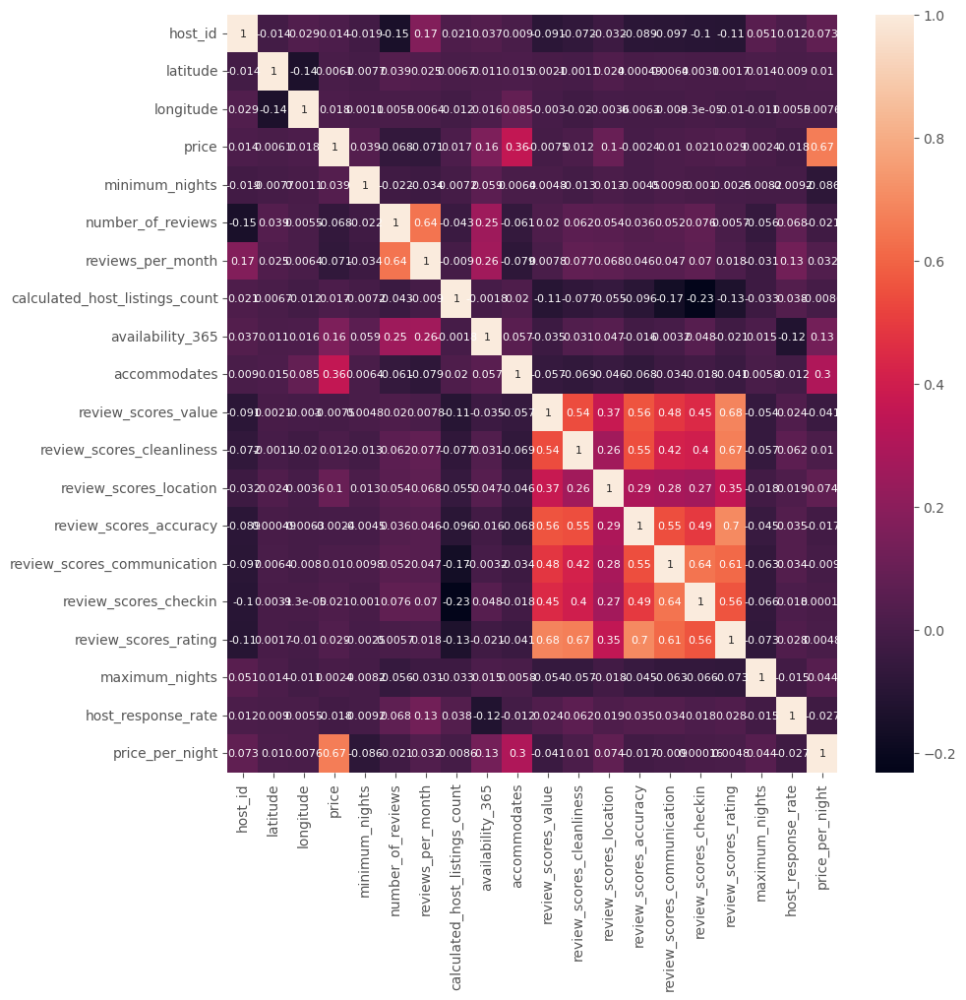

In [25]:
# Create a figure and axis object for the subplot
f, ax = plt.subplots(figsize=(10, 10))

# Create the correlation heatmap in seaborn
corr = sns.heatmap(numerical_df.corr(), annot=True, annot_kws={"size": 8}, ax=ax)

**Interpretation**
---------------------------

Perfect correlation (|r| = 1): All data points lie exactly on a straight line.

Strong correlation (0.7 ≤ |r| < 1): Most data points cluster tightly around a straight line.

Moderate correlation (0.3 ≤ |r| < 0.7): Data points tend to cluster around a straight line, but with more variability.

Weak correlation (0 < |r| < 0.3): Little to no clustering around a straight line.




* Moderate Positive correlation between :
   * price - price per night : 0.67
   * reviews_per_month - number_of_reviews: 0.64
   * price - accommodates : 0.36
   * price_per_night - accommodates: 0.3
   * review_score_value - review_score_cleanliness: 0.54
   * review_score_value - review_score_accuracy:  0.56
   * review_scpre_value - review_score_rating: 0-68

* Weak negative correlation between:
    * number_of_host_listings - review_score_checkin: - 0.23

When price increased or decreases, so does price per nigh too. Price variation is high.

With increasing reviews, the reviews_per_month increases too.

The accommondates has slight impact on the price.

Score values display the score rating.




In [26]:
# Exporting Bar figure to file on computer

corr.figure.savefig(os.path.join(path, '04 Visualization', 'corr_heatmap.png'))

## 8.1 Scatterplot

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


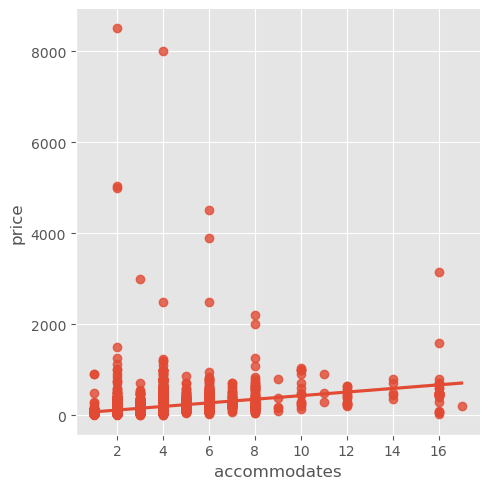

In [27]:
# Create a scatterplot for the "" and "price per unit" columns in seaborn

corr_scatter=sns.lmplot(x = 'accommodates', y = 'price', data = numerical_df)

A trend can be observed in which the prices increases when the number of accommodates also increases. 

However, there also cases in which the price does not change with increasing number of accommodates.

The biggest constant in price is shown when accommodates is 14 person, 12 person.

High variability when accomondates is 2, 6,16.
The reason could be type of property.

In [28]:
# Exporting Bar figure to file on computer

corr_scatter.figure.savefig(os.path.join(path, '04 Visualization', 'scatteraccomendates_price.png'))

## 8.2 Pairplot

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


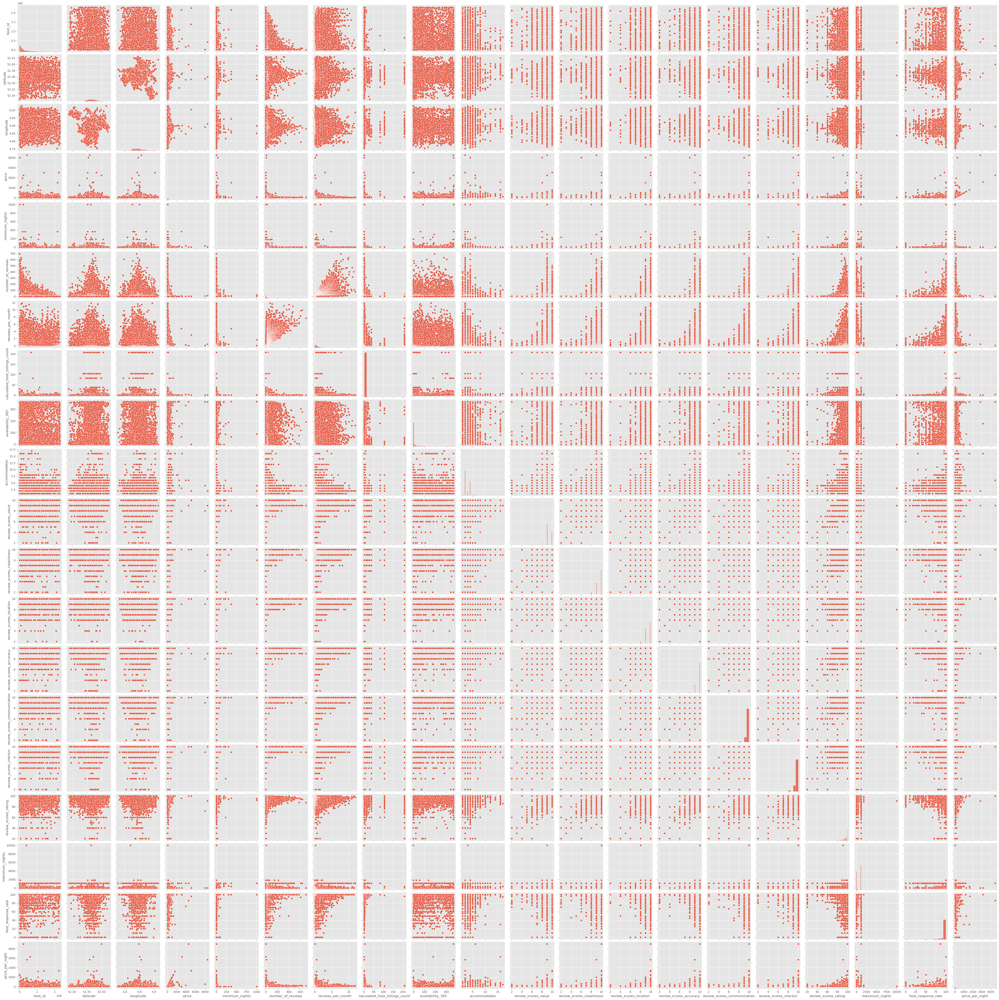

In [29]:
numeric_pair=sns.pairplot(data=numerical_df)

**Interpretation**

The majority of the host dont exceed price per night of 1000$, only some extreme cases surpasses even 2000 dollar per night.

Some host offer max. night up to 10000. The majority stays under 500 nights

The vast majortiy of the score_ratings are above 60 , only few are below 60.

The higher the host_id gets, the lower the number of reviews.

The higher the response rate the higher the revies_per_month.


In [30]:
ratings=numerical_df[['accommodates','review_scores_rating','reviews_per_month','price','host_response_rate']]

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


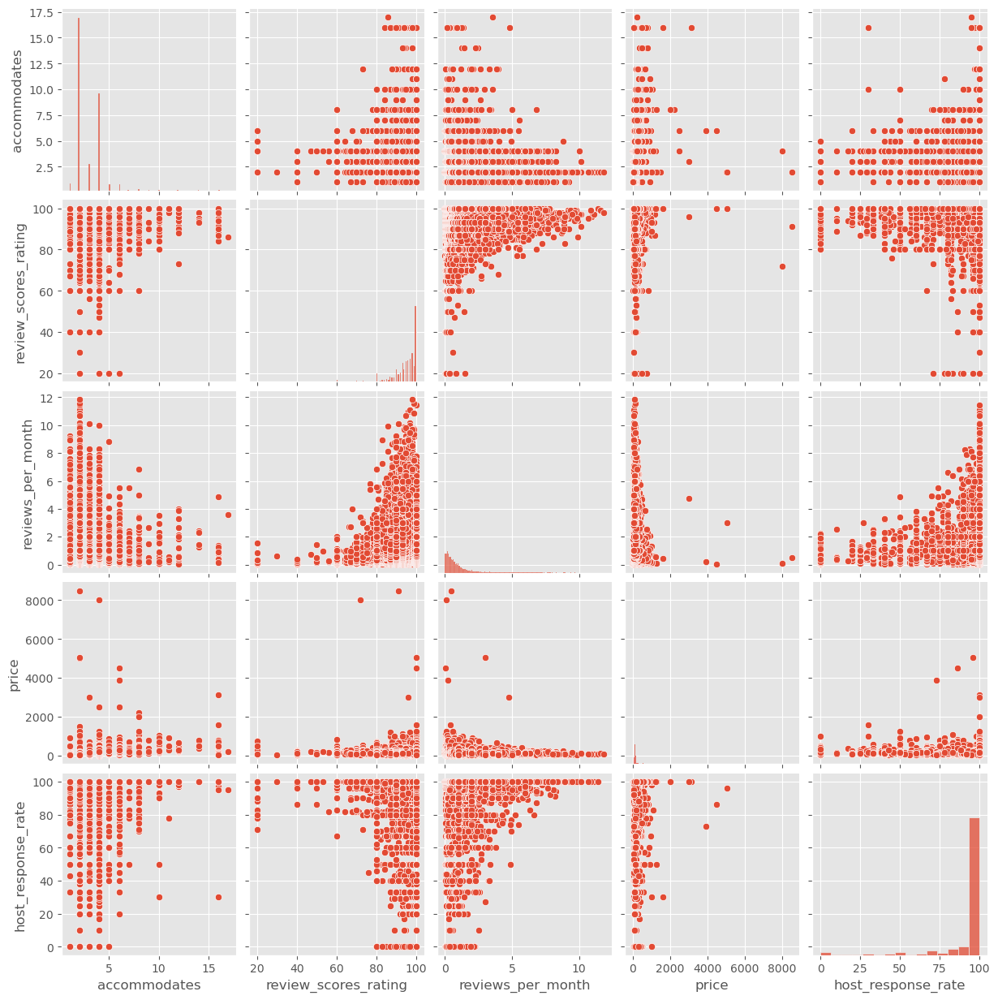

In [31]:
rating_pair=sns.pairplot(data=ratings)

**Interpretation**

* Guest prefer places that accommodate between 1 and 5 persons. The most popular listings offer 2 persons.
    * They also have the most ratings
    
* The majority of the guest give high review scores ratings of 100. The higher the reviews_per_month, the higher the scores_ratings.

* The most review_score_ratings belongs to listings under 2000 dollar.
    * This is what the most listings are, only few surpasses 2000 dollar


**Variables for further analysis**:

* price
* accommodates
* review_scores_rating
* reviews_per_month
* host_response_rate
* host_listings_count
* minimal_nights
* property_type
* neighbourhood
* number of reviews

In [32]:
numeric_pair.figure.savefig(os.path.join(path, '04 Visualization', 'numeric_pairplot_netherland.png'))

## 8.3 Categorial Plots

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


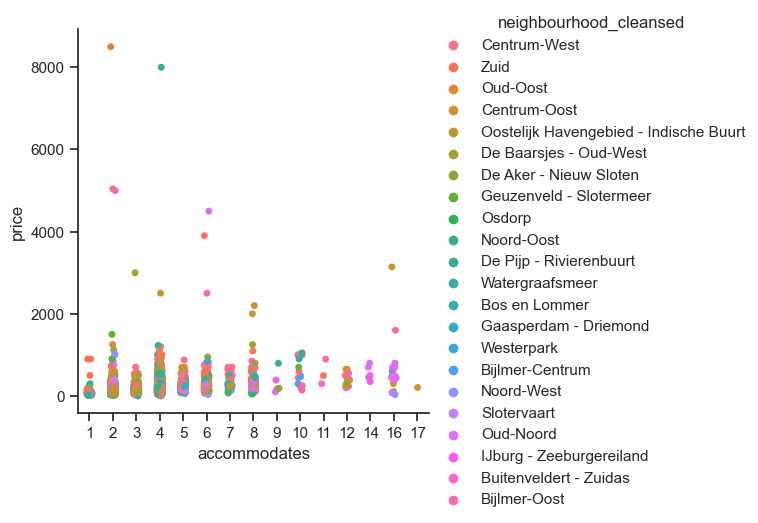

In [33]:
# Create a categorical plot in seaborn

sns.set(style="ticks")
corr_cat = sns.catplot(x="accommodates", y="price", hue="neighbourhood_cleansed", data=listings)

**Note**

Few listings over 2000 dollar belongs to areas of:

 * Oud_Oost
 * Noord-Oost
 * Oud-Noord
 * Slotervaart
 * Zuid
 * Centrum-OOst
 
 Check for average price of each neighbourhood

In [35]:
corr_cat.figure.savefig(os.path.join(path, '04 Visualization', 'corr_acc_price.png'))

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


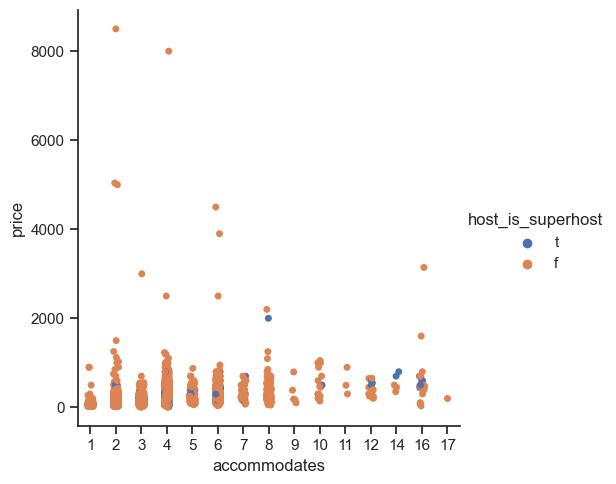

In [36]:
sns.set(style="ticks")
acc_price_host_cat = sns.catplot(x="accommodates", y="price", hue="host_is_superhost", data=listings)

In [37]:
acc_price_host_cat.figure.savefig(os.path.join(path, '04 Visualization', 'corr_acc_price_host.png'))

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


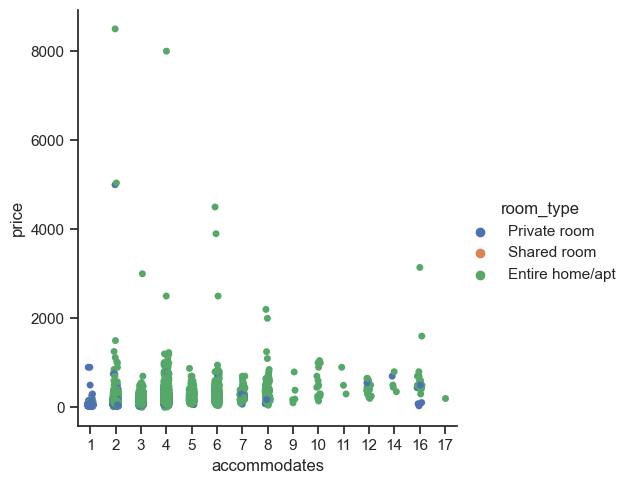

In [38]:
sns.set(style="ticks")
room_cat = sns.catplot(x="accommodates", y="price", hue="room_type", data=listings)

**NOTE**

* The majority of the room type is entire home/apt.
* Mostly not more than 2000 dollars.
* The majority of Private rooms is available for 1 person.

* Only 1 private room is over 4000 dollar, when having 2 person as guest.

* More private rooms for rent when accommodates is 16 person.

In [39]:
room_cat.figure.savefig(os.path.join(path, '04 Visualization', 'room_cat.png'))

**Interpretation**:

Neighbourhood "De Baarsjes" holds most listings, and altogether eight neigbourhoods have over one thousand listings.

* Bos en Lommer                             1140
* Oud-Oost                                  1280
* Zuid                                      1434
* Westerpark                                1485
* Centrum-Oost                              1726
* Centrum-West                              2316
* De Pijp - Rivierenbuurt                   2486
* De Baarsjes - Oud-West                    3497

The least listings holds Bijlmer-Oost:    96

# 9 Plots to questions

## 9.1 Market overview

### 9.1.1 Listing distribution

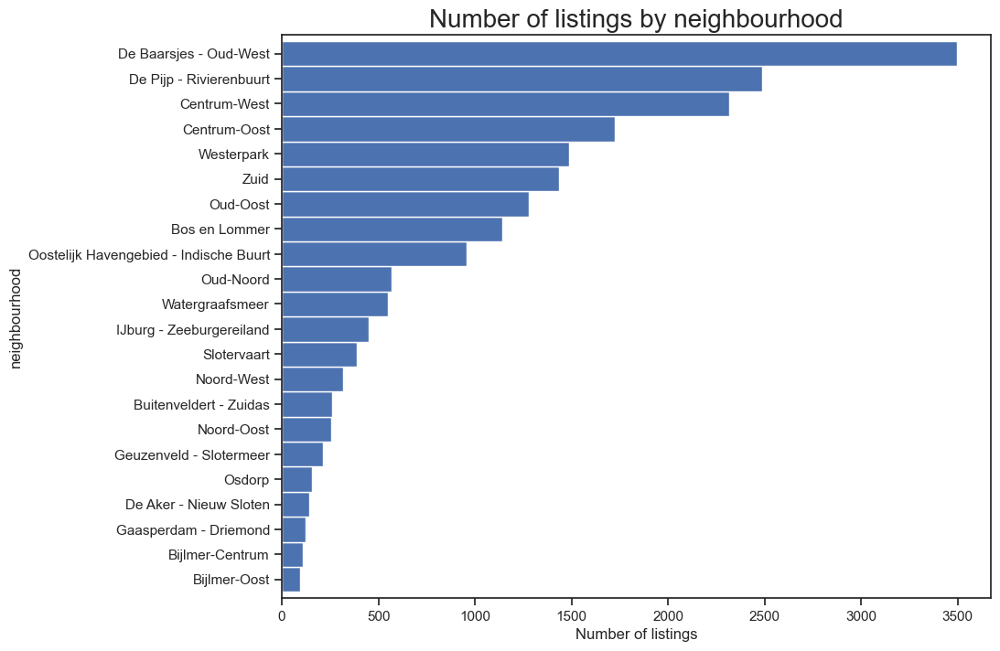

In [50]:
# Calculate the frequency of listings by neighborhood and sort by values
feq=listings['neighbourhood'].value_counts().sort_values(ascending=True)
feq_list_hood=feq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Number of listings by neighbourhood", fontsize=20)
plt.xlabel('Number of listings', fontsize=12)
plt.show()

In [52]:
feq

neighbourhood
Bijlmer-Oost                                96
Bijlmer-Centrum                            110
Gaasperdam - Driemond                      121
De Aker - Nieuw Sloten                     142
Osdorp                                     157
Geuzenveld - Slotermeer                    211
Noord-Oost                                 256
Buitenveldert - Zuidas                     262
Noord-West                                 318
Slotervaart                                390
IJburg - Zeeburgereiland                   449
Watergraafsmeer                            549
Oud-Noord                                  566
Oostelijk Havengebied - Indische Buurt     955
Bos en Lommer                             1140
Oud-Oost                                  1280
Zuid                                      1434
Westerpark                                1485
Centrum-Oost                              1726
Centrum-West                              2316
De Pijp - Rivierenbuurt                   2486

In [51]:
feq_list_hood.figure.savefig(os.path.join(path, '04 Visualization', 'feq_list_hood.png'))

### 9.1.2 Property type distribution

In [67]:
property_dis=listings['property_type'].value_counts().sort_values(ascending=True)
property_dis

property_type
Castle                        1
Tent                          1
Nature lodge                  1
Lighthouse                    1
Earth house                   1
Camper/RV                     2
Campsite                      2
Chalet                        3
Barn                          4
Hostel                        4
Tiny house                    5
Casa particular (Cuba)        5
Hotel                         7
Bungalow                     12
Cottage                      12
Cabin                        14
Boutique hotel               28
Villa                        30
Guesthouse                   43
Other                        51
Serviced apartment           63
Aparthotel                   73
Guest suite                 152
Houseboat                   225
Condominium                 320
Boat                        372
Loft                        384
Bed and breakfast           455
Townhouse                   646
House                      1515
Apartment                 

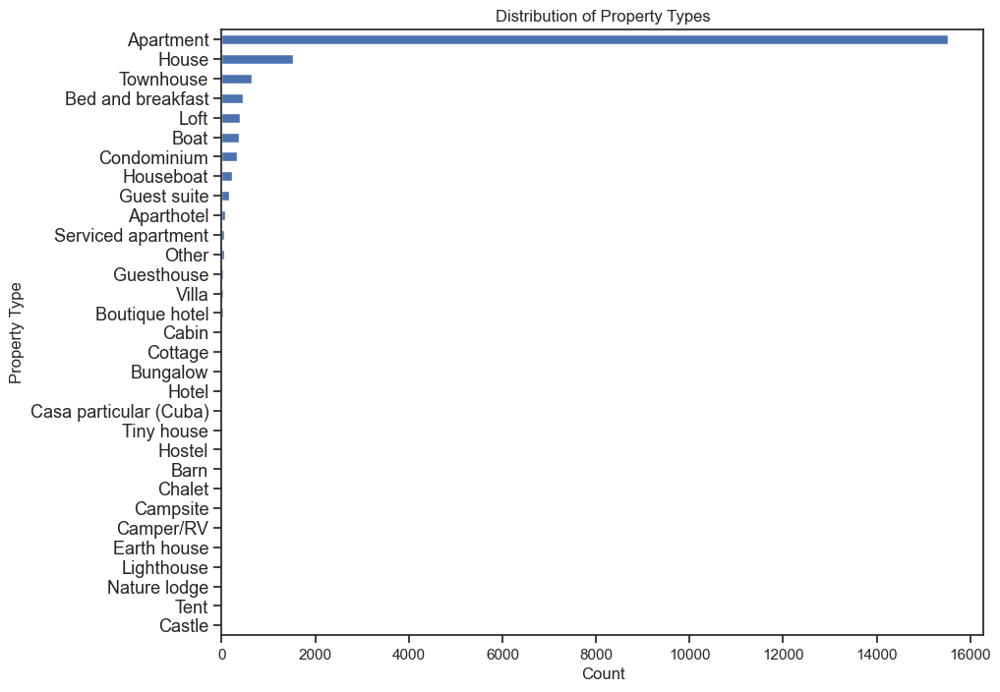

In [68]:
# Create the bar plot
plt.figure(figsize=(10, 8))
prop_dist=property_dis.plot(kind='barh')
plt.title('Distribution of Property Types')
plt.xlabel('Count')
plt.ylabel('Property Type')
plt.show()


In [69]:
prop_dist.figure.savefig(os.path.join(path, '04 Visualization', 'prop_dist.png'))

**NOTE**

A lot of property types have few listings, therefore i I will display only the ones with over 100 listings.

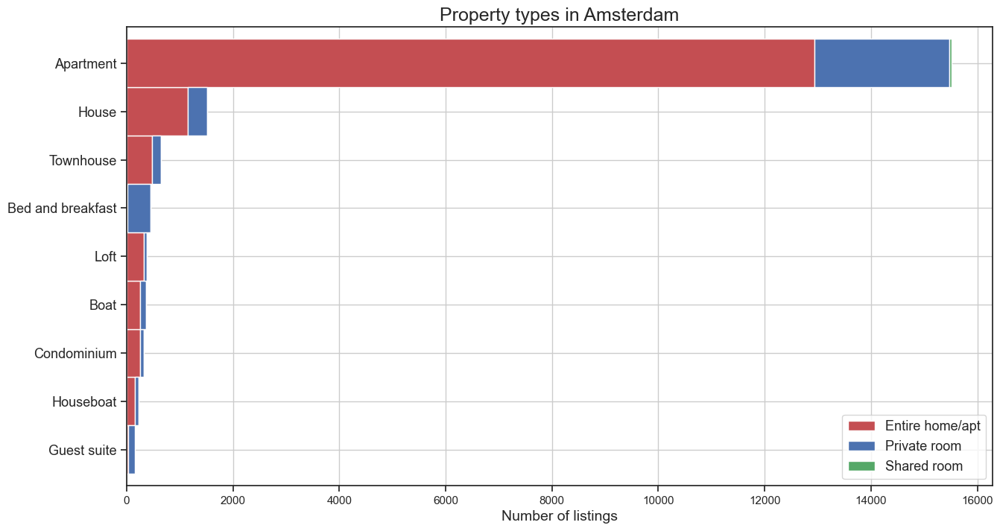

In [70]:
prop = listings.groupby(['property_type','room_type']).room_type.count()
prop = prop.unstack()
prop['total'] = prop.iloc[:,0:3].sum(axis = 1)
prop = prop.sort_values(by=['total'])
prop = prop[prop['total']>=100]
prop = prop.drop(columns=['total'])

prop_stacked=prop.plot(kind='barh',stacked=True, color = ["r","b","g"],
              linewidth = 1, grid=True, figsize=(15,8), width=1)
plt.title('Property types in Amsterdam', fontsize=18)
plt.xlabel('Number of listings', fontsize=14)
plt.ylabel("")
plt.legend(loc = 4,prop = {"size" : 13})
plt.rc('ytick', labelsize=13)
plt.show()

In [72]:
prop

room_type,Entire home/apt,Private room,Shared room
property_type,,,
Guest suite,36.0,116.0,NaN
Houseboat,154.0,69.0,2.0
Condominium,249.0,69.0,2.0
Boat,257.0,113.0,2.0
Loft,319.0,63.0,2.0
Bed and breakfast,23.0,426.0,6.0
Townhouse,475.0,167.0,4.0
House,1153.0,359.0,3.0
Apartment,12936.0,2536.0,42.0


In [71]:
prop_stacked.figure.savefig(os.path.join(path, '04 Visualization', 'prop_stacked.png'))

### 9.1.3 Room distribution:


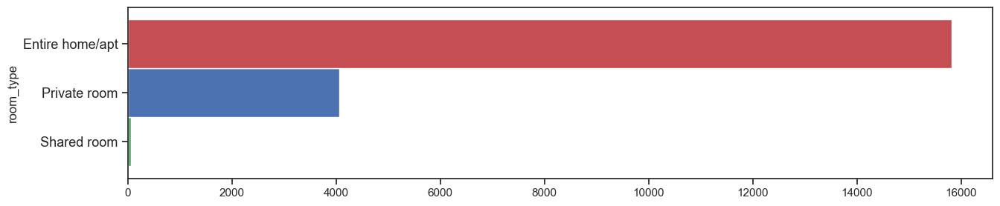

In [74]:
freq2 = listings['room_type']. value_counts().sort_values(ascending=True)
room_dist=freq2.plot.barh(figsize=(15, 3), width=1, color = ["g","b","r"])
plt.show()

In [75]:
room_dist.figure.savefig(os.path.join(path, '04 Visualization', 'room_dist.png'))

In [76]:
listings['room_type'].value_counts()

room_type
Entire home/apt    15822
Private room        4059
Shared room           65
Name: count, dtype: int64

### 9.1.4 Room Price mean

In [78]:
# calculate the mean price for each neighbourhood

price_room = listings.groupby('room_type')['price_per_night'].mean().sort_values(ascending=True)
price_room

room_type
Shared room        56.246154
Private room       59.596783
Entire home/apt    73.039871
Name: price_per_night, dtype: float64

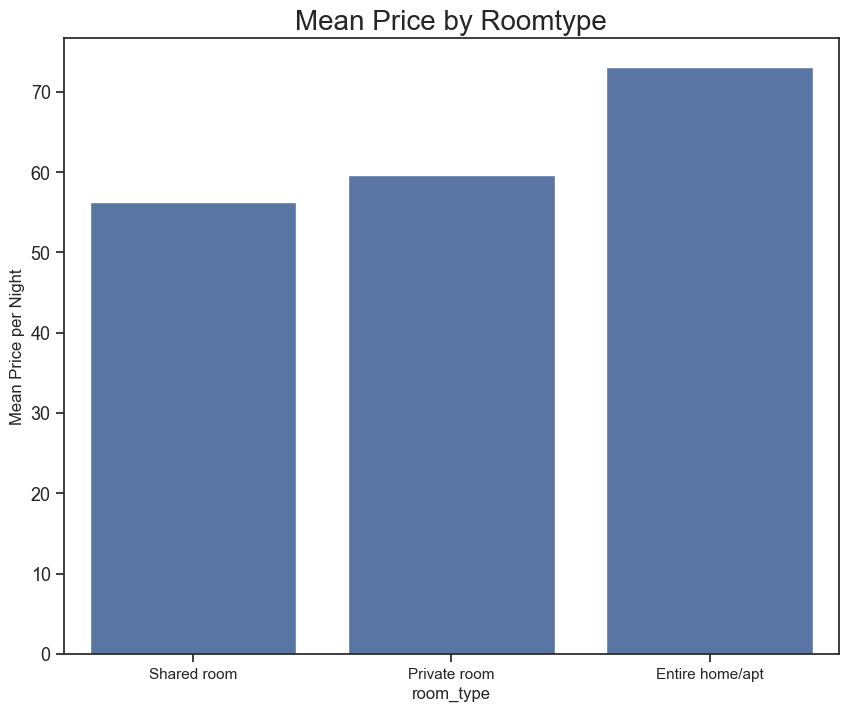

In [82]:
# Create the horizontal bar plot
plt.figure(figsize=(10, 8))
mean_price_room=sns.barplot(x=price_room.index, y=price_room.values, color='b')  # Add orient='h' for horizontal
plt.title("Mean Price by Roomtype", fontsize=20)
plt.ylabel('Mean Price per Night')
plt.show()


In [83]:
mean_price_room.figure.savefig(os.path.join(path, '04 Visualization', 'mean_price_room.png'))

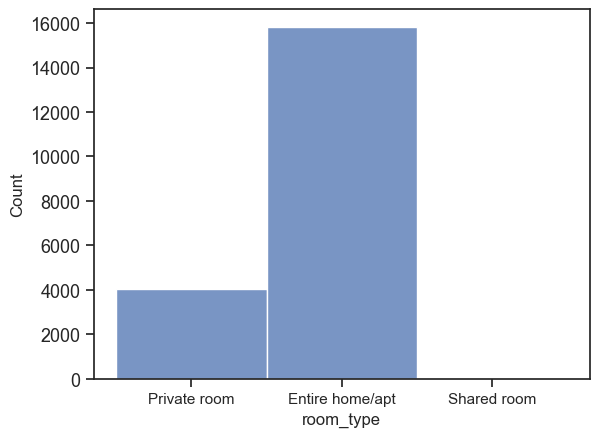

In [84]:
# Create a categorized histogram

hist_property=sns.histplot(data=listings, x='room_type', multiple='layer')

# Show the plot
plt.show()

In [85]:
hist_property.figure.savefig(os.path.join(path, '04 Visualization', 'hist_property.png'))

In [40]:
# calculate the mean price per night for each neighbourhood

price_nb = listings.groupby('neighbourhood_cleansed')['price_per_night'].mean().sort_values(ascending=True)


In [41]:
price_nb

neighbourhood_cleansed
Noord-West                                50.609471
Noord-Oost                                51.122758
Gaasperdam - Driemond                     53.420589
Bos en Lommer                             54.107305
Slotervaart                               57.000636
Osdorp                                    58.411116
Oostelijk Havengebied - Indische Buurt    58.995093
De Aker - Nieuw Sloten                    59.445694
Watergraafsmeer                           60.334256
Bijlmer-Centrum                           60.401970
Bijlmer-Oost                              60.850000
Oud-Oost                                  63.129040
Geuzenveld - Slotermeer                   63.447589
Buitenveldert - Zuidas                    64.536672
De Baarsjes - Oud-West                    65.374501
Westerpark                                67.181807
IJburg - Zeeburgereiland                  68.863490
De Pijp - Rivierenbuurt                   71.405438
Zuid                                     

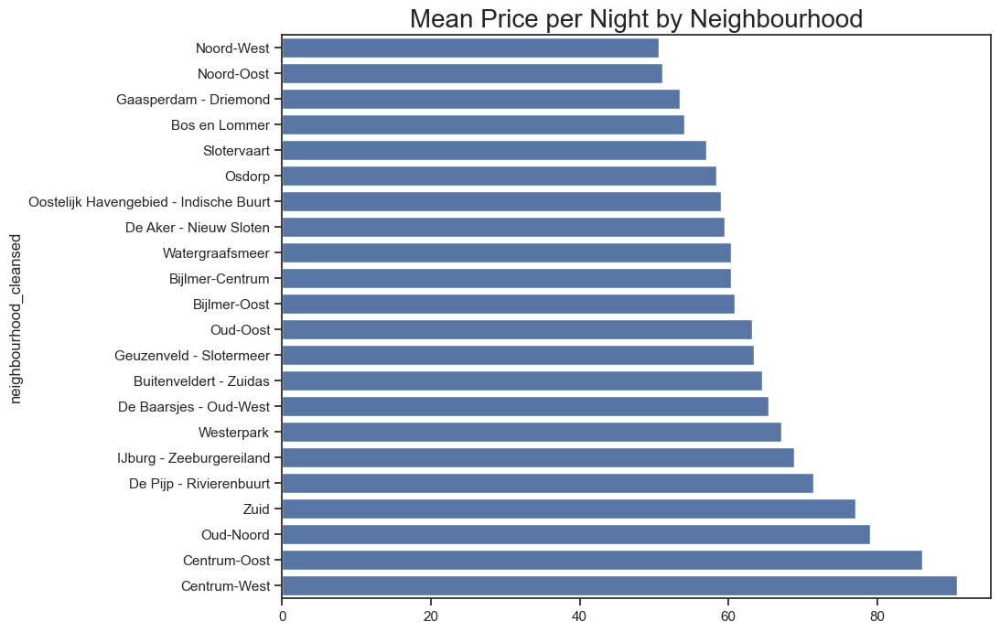

In [44]:
# Create the horizontal bar plot
plt.figure(figsize=(10, 8))
price_hood=sns.barplot(x=price_nb.values, y=price_nb.index, color='b', orient='h')  # Add orient='h' for horizontal
plt.title("Mean Price per Night by Neighbourhood", fontsize=20)
plt.show()


**Note**

* Hihest mean price/night is in Centrum West with 90.79 dollar
* Lowest mean price/night is in Noord-West, 50.6 dollar
* No neighbourhood has a mean < 50/night


In [45]:
price_hood.figure.savefig(os.path.join(path, '04 Visualization', 'price_hood.png'))

In [86]:
# calculate the mean price of perperty type for each property type

price_prop = listings.groupby('property_type')['price_per_night'].mean().sort_values(ascending=True)
price_prop

property_type
Camper/RV                  18.416667
Campsite                   35.000000
Chalet                     37.166667
Tent                       37.500000
Tiny house                 46.600000
Nature lodge               46.666667
Casa particular (Cuba)     56.476190
Cabin                      58.523810
Bungalow                   61.375000
Condominium                64.005246
Guest suite                64.532002
Apartment                  66.791691
Guesthouse                 68.767442
House                      73.999502
Cottage                    76.229167
Villa                      79.721429
Earth house                80.000000
Townhouse                  80.047185
Bed and breakfast          81.337275
Houseboat                  91.216360
Loft                       91.846198
Boat                       93.193619
Hostel                     97.250000
Boutique hotel            101.303571
Serviced apartment        111.716062
Barn                      113.333333
Castle                  

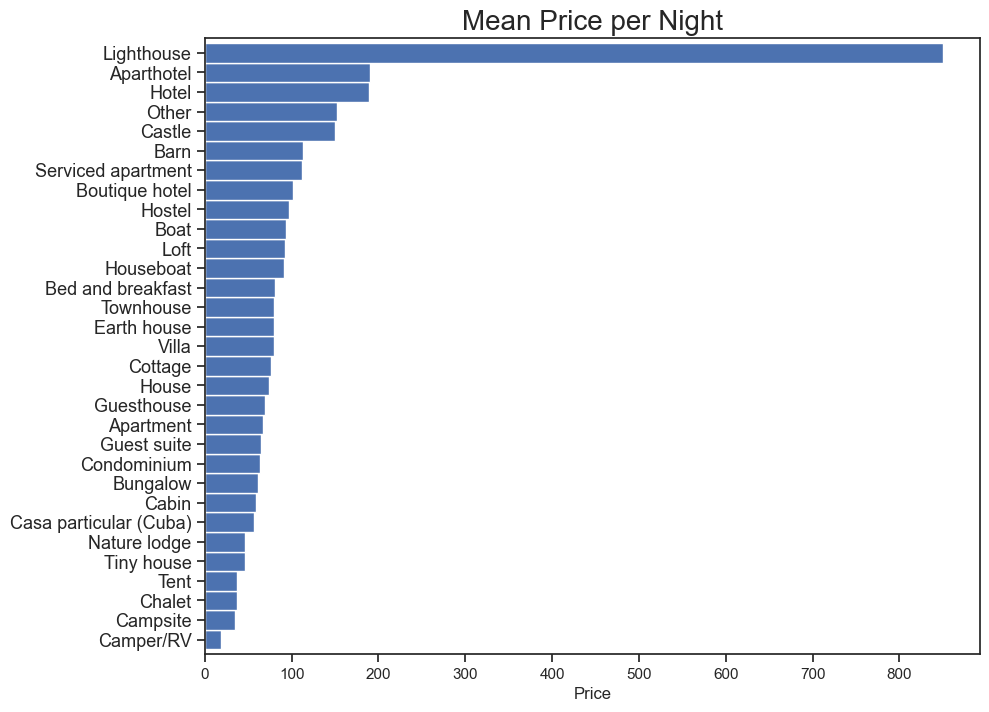

In [88]:

mean_price_hood=price_prop.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Mean Price per Night", fontsize=20)
plt.xlabel('Price', fontsize=12)
plt.ylabel('')
plt.show()

In [89]:
mean_price_hood.figure.savefig(os.path.join(path, '04 Visualization', 'mean_hood.png'))

### 9.1.5  Accommodates

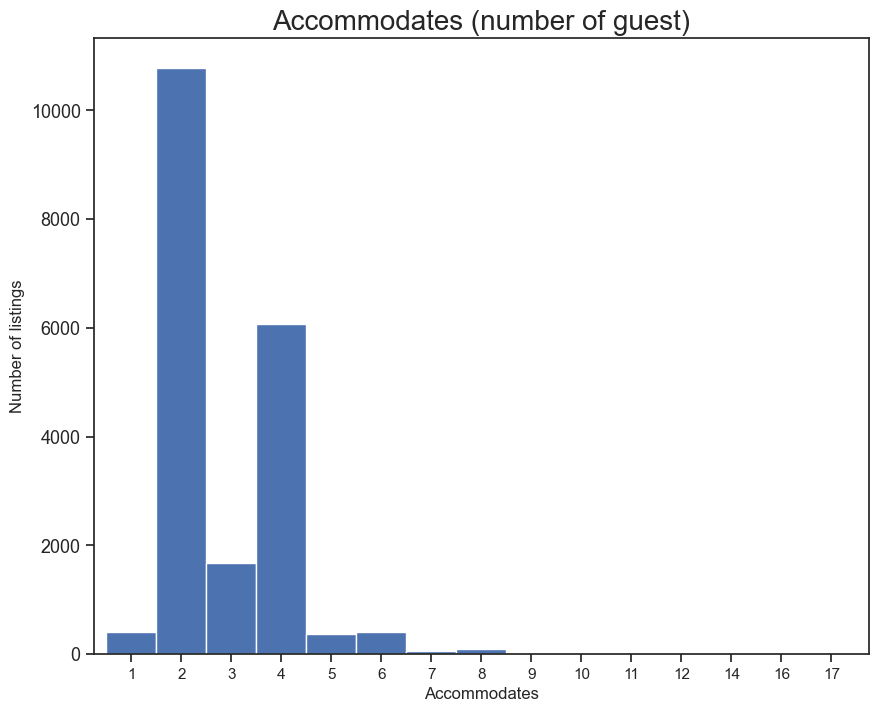

In [91]:
feq3=listings['accommodates'].value_counts().sort_index()
acco_hist=feq3.plot.bar(figsize=(10, 8), color='b', width=1, rot=0)
plt.title("Accommodates (number of guest)", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.xlabel('Accommodates', fontsize=12)
plt.show()

**Note**

The majority of the listings are for 2 person. 

However, airbnb allows until 16 person per listing.

In [92]:
acco_hist.figure.savefig(os.path.join(path, '04 Visualization', 'acco_hist.png'))

## 9.2 Host Analysis

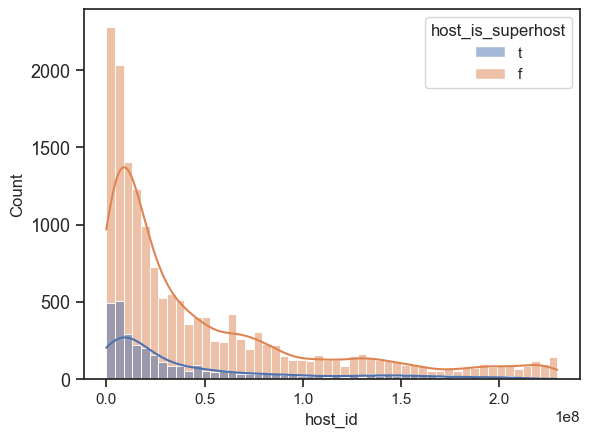

In [116]:
host_dist_super=sns.histplot(data=listings, x='host_id',hue='host_is_superhost',multiple='layer',kde=True)


In [117]:
host_dist_super.figure.savefig(os.path.join(path, '04 Visualization', 'host_dist_super.png'))

**NOTE**

Majority of hosts are regular host

### 9.2.1 Fraud or professional host?

In [114]:
# Check for listing count of hosts

freq4 = listings.groupby(['host_id']).size().reset_index(name='num_host_listings')
host_prop = freq4.groupby(['num_host_listings']).size().reset_index(name='count').transpose()
host_prop.columns = host_prop.iloc[0]
host_prop = host_prop.drop(host_prop.index[0])
host_prop

num_host_listings,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,19,21,24,25,27,30,38,83,105,208
count,15761,1100,172,50,37,24,10,5,4,3,3,3,1,1,1,1,1,2,2,1,1,1,1,1,1,1,1


**NOTE**

15761 hosts have listed 1 property, 1100 listed 2 prperties.

Those might be people who help friends and family with AirBnB.

However, 1 host has listed 208 items. This does not look like a private person or a real person.
In general, host with > 13 items are doing it for themselves.

In [120]:
## check for host with > 13 items
freq5 = listings.groupby(['host_id', 'host_name','host_identity_verified']).size().reset_index(name='num_host_listings')
freq5 = freq5.sort_values(by=['num_host_listings'], ascending=False)
freq5 = freq5[freq5['num_host_listings'] >= 13]
freq5


,host_id,host_name,host_identity_verified,num_host_listings
12851,65859990,Martijn,f,208
592,1464510,Michiel And Jane,t,105
13380,76104209,Rated,f,83
14750,113977564,Willem,f,38
210,517215,Niels En Viv (Welcome Back),t,30
14615,107745142,Oscar,f,27
6364,14183886,Luis,t,25
5698,11969034,Raul,t,24
11277,44168250,Ruben,f,21
4043,7594884,"Ruben, Sarah & Lindy",f,21


In [112]:
## Host with too many listings

private = listings[listings['room_type'] == "Private room"]
host_private = private.groupby(['host_id', 'host_name', 'street']).size().reset_index(name='private_rooms').sort_values(by=['private_rooms'], ascending=False)
host_private.head()

,host_id,host_name,street,private_rooms
2425,67005410,Feliciano,"Amsterdam, Noord-Holland, Netherlands",15
2103,44168250,Ruben,"Amsterdam, Noord-Holland, Netherlands",13
917,10076897,Geraldine,"Amsterdam, Noord-Holland, Netherlands",13
3195,174174070,Amrath,"Badhoevedorp, Badhoevedorp, Netherlands",7
1562,22879651,Wamme,"Amsterdam, Noord-Holland, Netherlands",7


In [113]:
# check for Feliciano as host

feliciano = private[private['host_id']== 67005410]
feliciano = feliciano[['name','host_id', 'host_name', 'latitude', 'longitude']]
feliciano.index.name = "listing_id"
feliciano

,name,host_id,host_name,latitude,longitude
listing_id,,,,,
12392592,Hotel in the heart of Amsterdam 2p,67005410,Feliciano,52.375251,4.900321
12444222,Hotel in the heart of Amsterdam 4p,67005410,Feliciano,52.375130,4.899694
12446710,Hotel in the heart of Amsterdam 3p,67005410,Feliciano,52.374695,4.900266
12451293,"Hotel in the heart of Amsterdam, Single room",67005410,Feliciano,52.374682,4.898916
12579177,Hotel in the heart of Amsterdam 2p,67005410,Feliciano,52.374567,4.898310
12582071,Hotel in the heart of Amsterdam 3p,67005410,Feliciano,52.373407,4.900022
12865293,Hotel in the heart of Amsterdam 2p,67005410,Feliciano,52.375077,4.900191
12865495,Hotel in the heart of Amsterdam 2p,67005410,Feliciano,52.373396,4.898427
12898673,Hotel in the heart of Amsterdam 1p,67005410,Feliciano,52.373346,4.898344


**NOTE**

Looks like Feliciano is in possession of many properties not far away from each other, all of them are considereed Private rooms.

Host_id 65859990, Martijn has 208 listings!
* a little suspicious because not verified identity
    
Host_id 1464510, Michiel And Jane has 105 listings!
* verified but still suspicous

### 9.2.2 Verified Host

In [121]:
verified_host=listings.groupby('neighbourhood_cleansed')['host_identity_verified'].count().sort_values(ascending=True)

In [122]:
verified_host

neighbourhood_cleansed
Bijlmer-Oost                                96
Bijlmer-Centrum                            110
Gaasperdam - Driemond                      121
De Aker - Nieuw Sloten                     142
Osdorp                                     157
Geuzenveld - Slotermeer                    211
Noord-Oost                                 256
Buitenveldert - Zuidas                     262
Noord-West                                 318
Slotervaart                                390
IJburg - Zeeburgereiland                   449
Watergraafsmeer                            549
Oud-Noord                                  566
Oostelijk Havengebied - Indische Buurt     955
Bos en Lommer                             1140
Oud-Oost                                  1280
Zuid                                      1434
Westerpark                                1485
Centrum-Oost                              1726
Centrum-West                              2316
De Pijp - Rivierenbuurt              

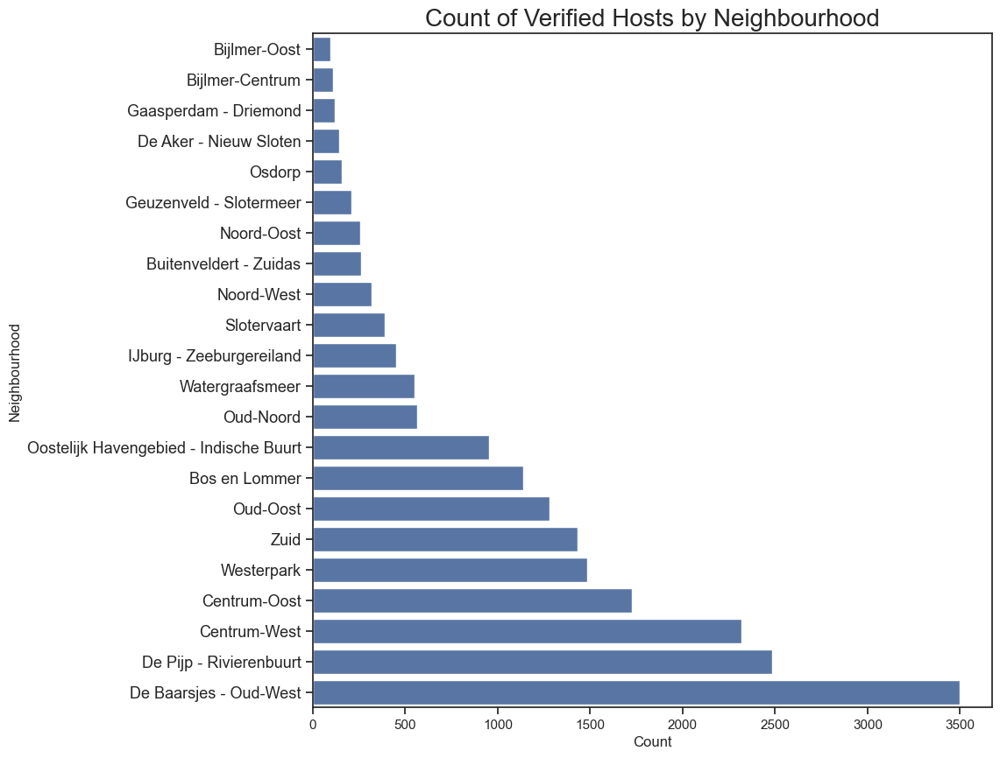

In [124]:
plt.figure(figsize=(10, 10))
verified_host=sns.barplot(x=verified_host.values, y=verified_host.index, color='b')
plt.title("Count of Verified Hosts by Neighbourhood", fontsize=20)
plt.xlabel("Count", fontsize=12)
plt.ylabel("Neighbourhood", fontsize=12)
plt.show()

In [125]:
verified_host.figure.savefig(os.path.join(path, '04 Visualization', 'verified_host.png'))

### 9.2.3 Superhost

* Superhost responses 90% of the messages within 24h.
* Superhost have >= 10 stays in the past year

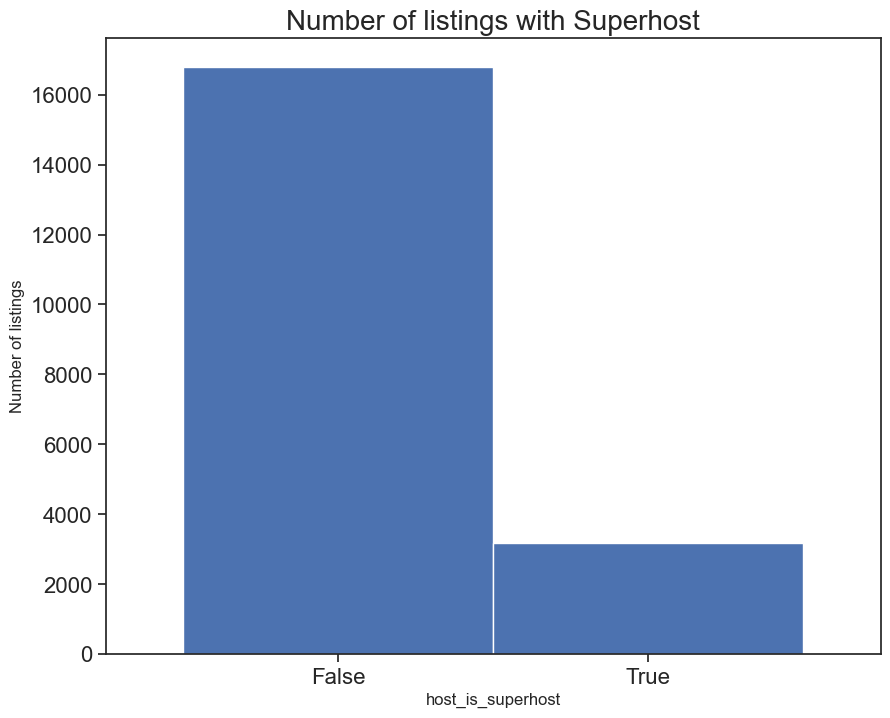

In [164]:
listings.host_is_superhost = listings.host_is_superhost.replace({"t": "True", "f": "False"})

superhost=listings['host_is_superhost'].value_counts()
superhost=superhost.plot.bar(figsize=(10, 8), width=1, rot=0)
plt.title("Number of listings with Superhost", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.show()

In [166]:
superhost.figure.savefig(os.path.join(path, '04 Visualization', 'superhost.png'))


The vast majortiy of the host are in fact, not superhost.
However, the reviews out of more than 100 reviews, still shows a average of 8 to 10 ratings.
This is a good sign.

But will superhost charge more money??

In [167]:
superhost_price=listings.groupby('host_is_superhost')['price_per_night'].mean()

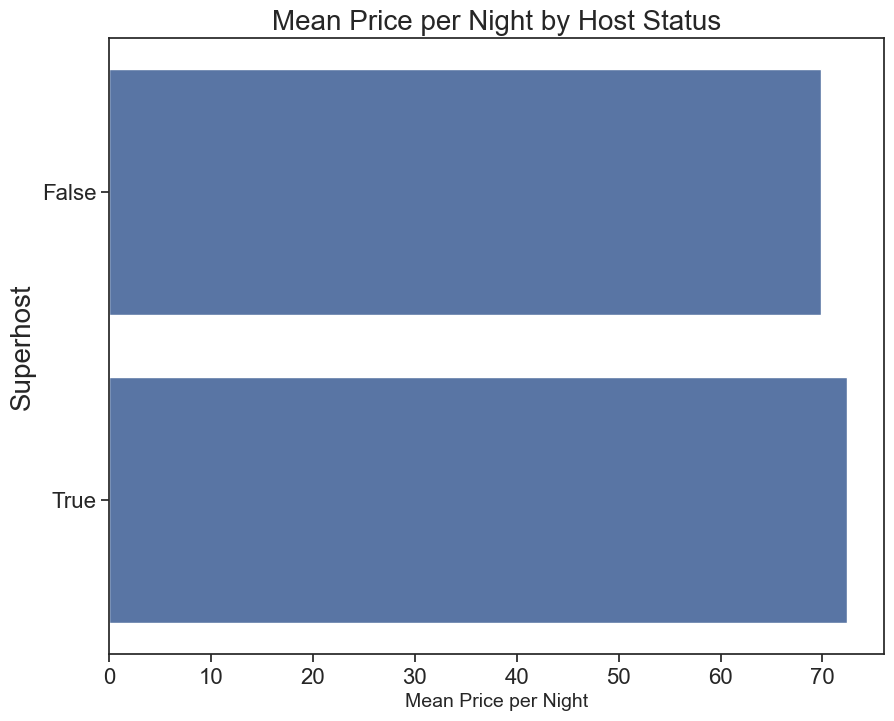

In [169]:
# Create the bar plot
plt.figure(figsize=(10, 8))
price_super=sns.barplot(x=superhost_price.values, y=superhost_price.index, color='b')
plt.title("Mean Price per Night by Host Status", fontsize=20)
plt.xlabel("Mean Price per Night", fontsize=14)
plt.ylabel("Superhost", fontsize=20)
plt.show()

**NOTE**

Minimal differences in price per night between super and non-super

In [170]:
price_super.figure.savefig(os.path.join(path, '04 Visualization', 'price_super.png'))

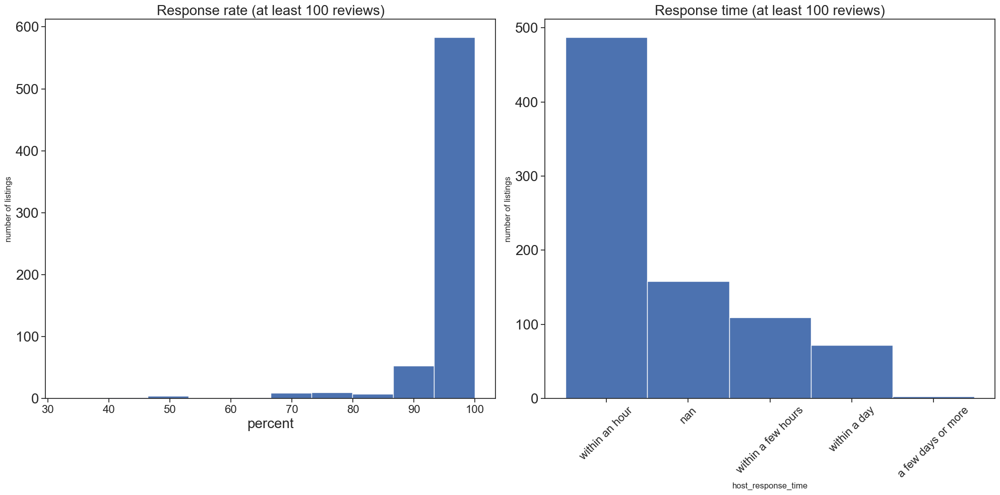

In [172]:
# Check for host resonse time and rate

fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq1 = listings100['host_response_rate'].dropna()
ax1= plt.hist(feq1)
plt.title("Response rate (at least 100 reviews)", fontsize=20)
plt.ylabel("number of listings")
plt.xlabel("percent", fontsize=20)

ax2 = fig.add_subplot(122)
feq2 = listings100['host_response_time'].value_counts()
ax2=feq2.plot.bar(color='b', width=1, rot=45)
plt.title("Response time (at least 100 reviews)", fontsize=20)
plt.ylabel("number of listings")

plt.tight_layout()
plt.show()

**NOTE**
* nan means that the host has not been contacted yet by any guest
* Response rate is clearly almost 100% in general and within an hour.
* Almost all responses are within a day to within 1 hour. 


## 9.3 Price analysis

I will select only the most common property types to compare with each other. In this case, properties with accommodates of 2 persons.

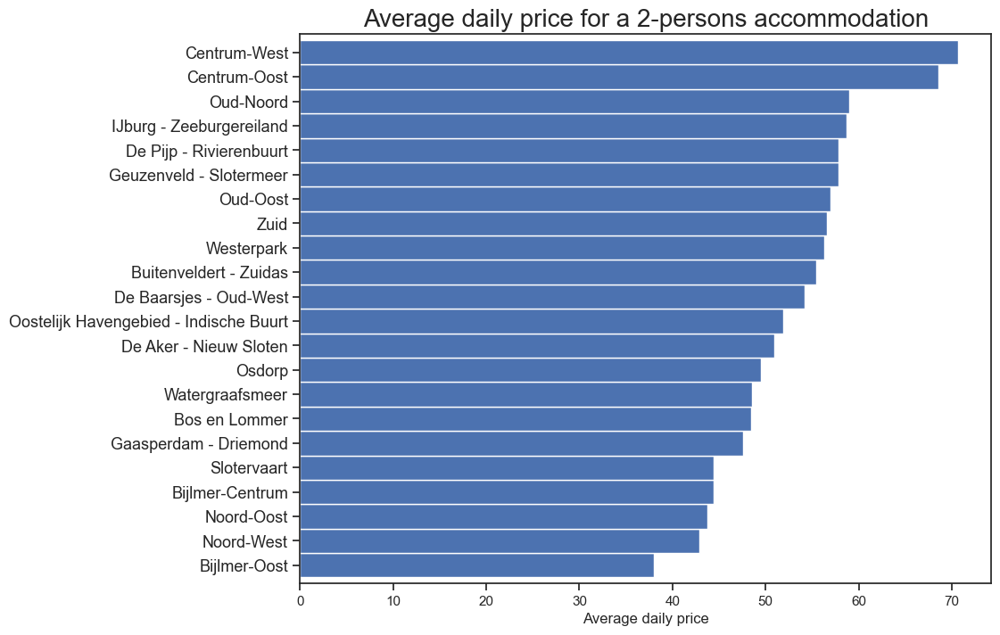

In [128]:
feq6 = listings[listings['accommodates']==2]
feq6 = feq6.groupby('neighbourhood')['price_per_night'].mean().sort_values(ascending=True)
avg_hood=feq6.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price', fontsize=12)
plt.ylabel("")
plt.show()

**Note**
* accommodation in the city centre is the most expensive

In [129]:
avg_hood.figure.savefig(os.path.join(path, '04 Visualization', 'avg_hood.png'))

In [130]:
feq6

neighbourhood
Bijlmer-Oost                              38.038406
Noord-West                                42.907401
Noord-Oost                                43.720884
Bijlmer-Centrum                           44.431452
Slotervaart                               44.459575
Gaasperdam - Driemond                     47.618750
Bos en Lommer                             48.438319
Watergraafsmeer                           48.558694
Osdorp                                    49.490385
De Aker - Nieuw Sloten                    50.889832
Oostelijk Havengebied - Indische Buurt    51.865815
De Baarsjes - Oud-West                    54.198657
Buitenveldert - Zuidas                    55.399464
Westerpark                                56.252515
Zuid                                      56.541512
Oud-Oost                                  57.006792
Geuzenveld - Slotermeer                   57.802261
De Pijp - Rivierenbuurt                   57.816201
IJburg - Zeeburgereiland                  58.72011

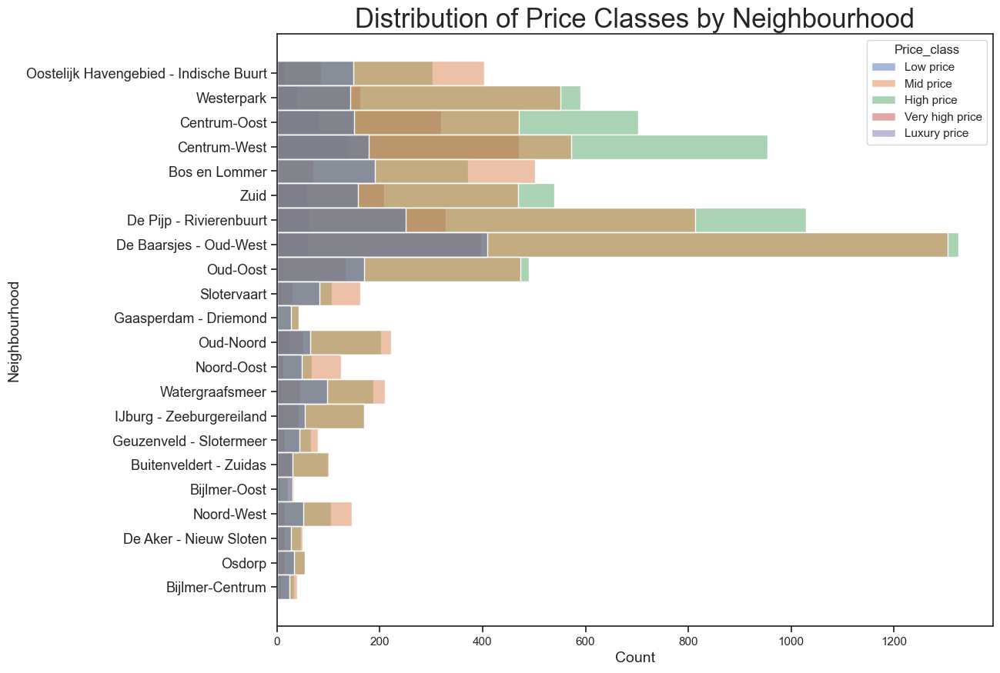

In [132]:
## price classses in different neighbourhoods

plt.figure(figsize=(12, 10))
hood_class=sns.histplot(data=listings, y='neighbourhood', hue='Price_class', multiple='layer')
plt.title("Distribution of Price Classes by Neighbourhood", fontsize=25)
plt.xlabel("Count", fontsize=14)
plt.ylabel("Neighbourhood", fontsize=14)
plt.show()

•	The highest listing of Low-price items are in DeBaarsjes-Oud-West, as well the highest in Mid-price items. 

•	The area with the highest number of High-price items is Centrum-West.


In [133]:
hood_class.figure.savefig(os.path.join(path, '04 Visualization', 'hood_class.png'))

## 9.4 Rating and scoring analysis

/Users/phongsathorn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x1300 with 0 Axes>

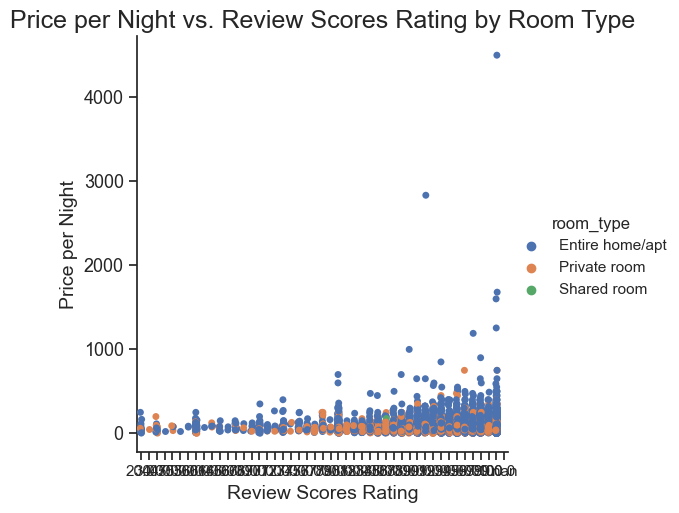

In [134]:
# Create the categorical plot

plt.figure(figsize=(12, 13))  

sns.catplot(data=listings, x='review_scores_rating', y='price_per_night', hue='room_type')
plt.title("Price per Night vs. Review Scores Rating by Room Type", fontsize=18)  # Decreased font size
plt.xlabel("Review Scores Rating", fontsize=14)  
plt.ylabel("Price per Night", fontsize=14)  
plt.show()


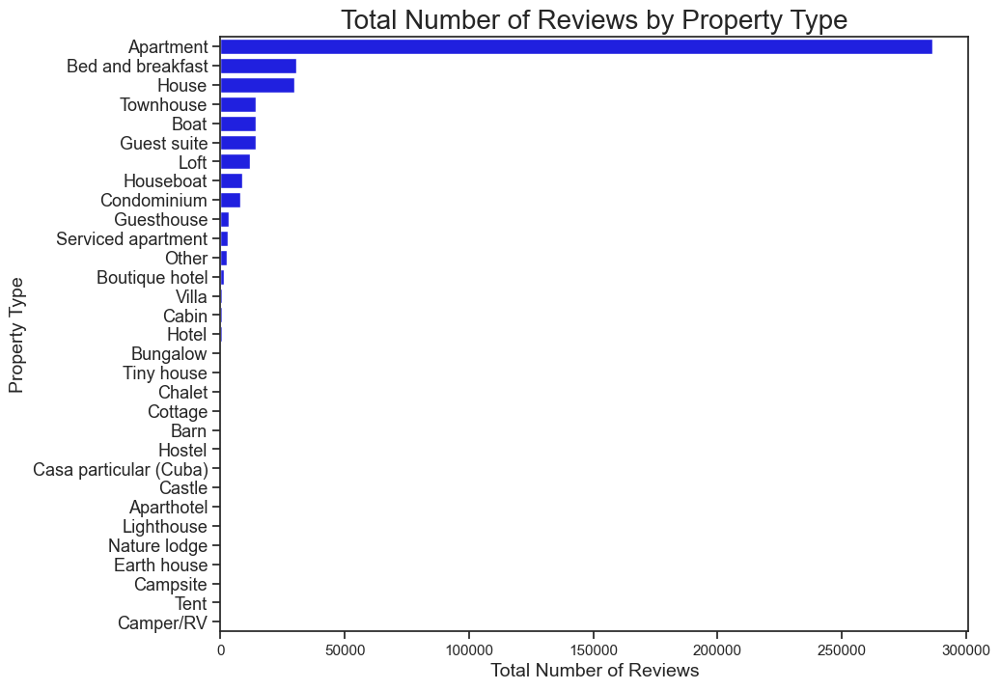

In [136]:
# Group by property type and calculate the sum of number_of_reviews
popular_property = listings.groupby('property_type')['number_of_reviews'].sum().sort_values(ascending=False)

# Create the bar plot
plt.figure(figsize=(10, 8))
sum_review=sns.barplot(x=popular_property.values, y=popular_property.index, color='blue')
plt.title("Total Number of Reviews by Property Type", fontsize=20)
plt.xlabel("Total Number of Reviews", fontsize=14)
plt.ylabel("Property Type", fontsize=14)
plt.show()

**Note**

Most reviews are received by Apartments, Bed and Bed and Breakfast, and houses.

In [137]:
sum_review.figure.savefig(os.path.join(path, '04 Visualization', 'sum_review.png'))

In [138]:
popular_property

property_type
Apartment                 286687
Bed and breakfast          30463
House                      29740
Townhouse                  14171
Boat                       14159
Guest suite                14073
Loft                       11812
Houseboat                   8704
Condominium                 8132
Guesthouse                  3518
Serviced apartment          2896
Other                       2508
Boutique hotel              1268
Villa                        815
Cabin                        799
Hotel                        514
Bungalow                     317
Tiny house                   215
Chalet                       133
Cottage                      129
Barn                          83
Hostel                        56
Casa particular (Cuba)        26
Castle                        14
Aparthotel                     4
Lighthouse                     3
Nature lodge                   2
Earth house                    2
Campsite                       1
Tent                         

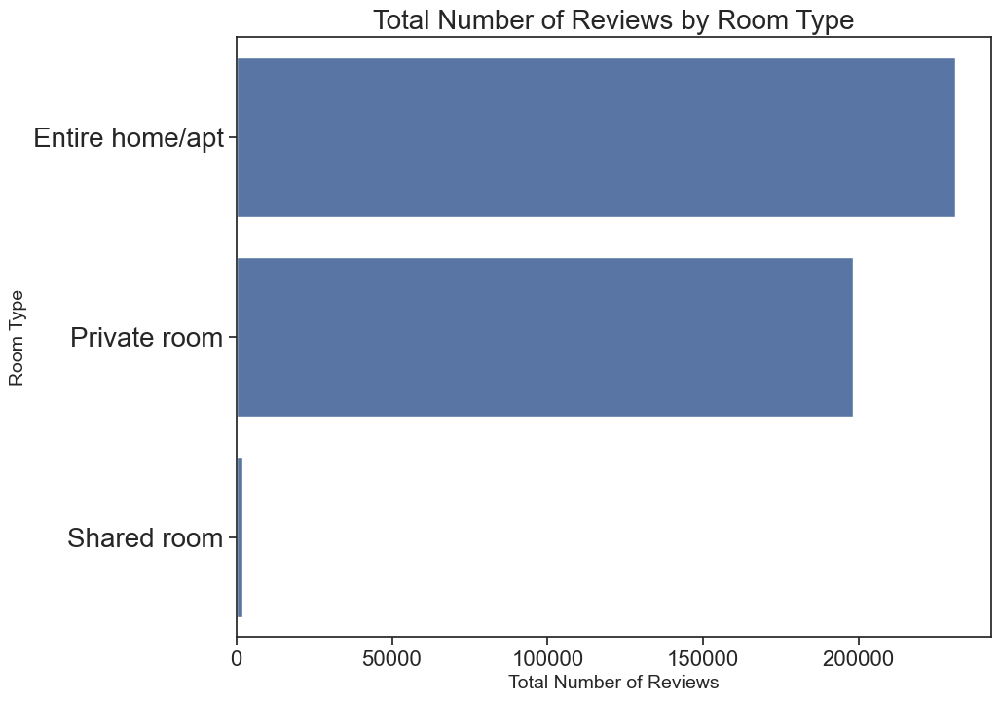

In [146]:
# Group by property type and calculate the sum of number of reviews
popular_room = listings.groupby('room_type')['number_of_reviews'].sum().sort_values(ascending=False)

# Create the bar plot
plt.figure(figsize=(10, 8))
reviews_room=sns.barplot(x=popular_room.values, y=popular_room.index, color='b')
plt.title("Total Number of Reviews by Room Type", fontsize=20)
plt.xlabel("Total Number of Reviews", fontsize=14)
plt.ylabel("Room Type", fontsize=14)
plt.show()

In [147]:
reviews_room.figure.savefig(os.path.join(path, '04 Visualization', 'reviews_room.png'))

In [140]:
popular_room.head()

room_type
Entire home/apt    230991
Private room       198311
Shared room          1942
Name: number_of_reviews, dtype: int64

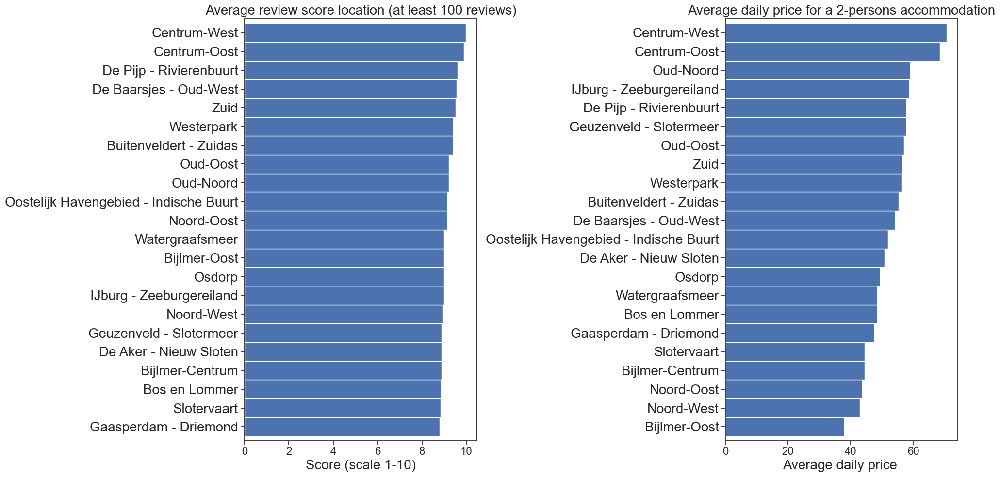

In [152]:
##grouping the review scores for the location by neighbourhood 
#(only listings with at least 100 reviews

fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq7 = listings[listings['number_of_reviews']>=100]
feq7 = feq7.groupby('neighbourhood')['review_scores_location'].mean().sort_values(ascending=True)
ax1=feq7.plot.barh(color='b', width=1)
plt.title("Average review score location (at least 100 reviews)", fontsize=20)
plt.xlabel('Score (scale 1-10)', fontsize=20)
plt.ylabel("")

ax2 = fig.add_subplot(122)
feq8 = listings[listings['accommodates']==2]
feq8 = feq8.groupby('neighbourhood')['price_per_night'].mean().sort_values(ascending=True)
ax2=feq8.plot.barh(color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price ', fontsize=20)
plt.ylabel("")

plt.tight_layout()

# Save the figure as a PNG file
plt.savefig('output_figure.png')

plt.show()


In [153]:
feq7

neighbourhood
Gaasperdam - Driemond                     8.800000
Slotervaart                               8.833333
Bos en Lommer                             8.861111
Bijlmer-Centrum                           8.875000
De Aker - Nieuw Sloten                    8.882353
Geuzenveld - Slotermeer                   8.888889
Noord-West                                8.933333
IJburg - Zeeburgereiland                  9.000000
Osdorp                                    9.000000
Bijlmer-Oost                              9.000000
Watergraafsmeer                           9.000000
Noord-Oost                                9.142857
Oostelijk Havengebied - Indische Buurt    9.156250
Oud-Noord                                 9.214286
Oud-Oost                                  9.214286
Buitenveldert - Zuidas                    9.400000
Westerpark                                9.416667
Zuid                                      9.521739
De Baarsjes - Oud-West                    9.566667
De Pijp - Riviere

In [154]:
feq8

neighbourhood
Bijlmer-Oost                              38.038406
Noord-West                                42.907401
Noord-Oost                                43.720884
Bijlmer-Centrum                           44.431452
Slotervaart                               44.459575
Gaasperdam - Driemond                     47.618750
Bos en Lommer                             48.438319
Watergraafsmeer                           48.558694
Osdorp                                    49.490385
De Aker - Nieuw Sloten                    50.889832
Oostelijk Havengebied - Indische Buurt    51.865815
De Baarsjes - Oud-West                    54.198657
Buitenveldert - Zuidas                    55.399464
Westerpark                                56.252515
Zuid                                      56.541512
Oud-Oost                                  57.006792
Geuzenveld - Slotermeer                   57.802261
De Pijp - Rivierenbuurt                   57.816201
IJburg - Zeeburgereiland                  58.72011

* Overall Experience. What was your overall experience?
* Cleanliness. Did you feel that your space was clean and tidy?
* Accuracy. How accurately did your listing page represent your space?
* Value. Did you feel your listing provided good value for the price?
* Communication. How well did you communicate with your host before and during their stay?
* Arrival. How smoothly did their check-in go?
* Location. How did you feel about the neighborhood?

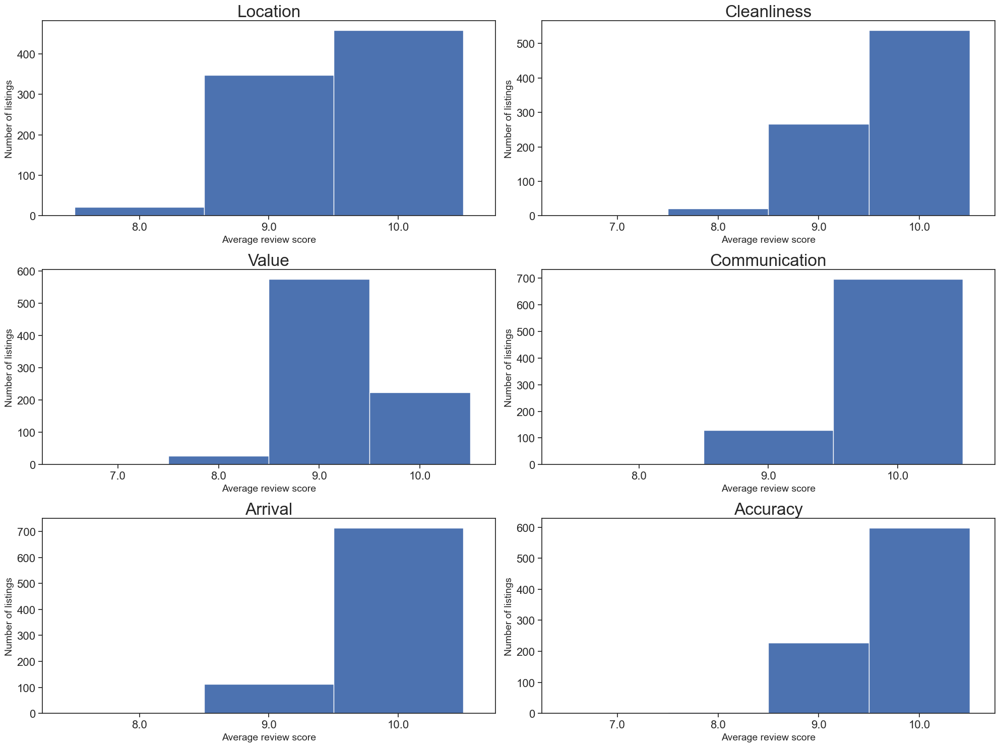

In [157]:
# Comparing the scoring distribution

listings100 = listings[listings['number_of_reviews']>=100]

fig = plt.figure(figsize=(20,15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax1 = fig.add_subplot(321)
feq=listings100['review_scores_location'].value_counts().sort_index()
ax1=feq.plot.bar(color='b', width=1, rot=0)
#ax1.tick_params(axis = 'both', labelsize = 16)
plt.title("Location", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax2 = fig.add_subplot(322)
feq=listings100['review_scores_cleanliness'].value_counts().sort_index()
ax2=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Cleanliness", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax3 = fig.add_subplot(323)
feq=listings100['review_scores_value'].value_counts().sort_index()
ax3=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Value", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax4 = fig.add_subplot(324)
feq=listings100['review_scores_communication'].value_counts().sort_index()
ax4=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Communication", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax5 = fig.add_subplot(325)
feq=listings100['review_scores_checkin'].value_counts().sort_index()
ax5=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Arrival", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax6 = fig.add_subplot(326)
feq=listings100['review_scores_accuracy'].value_counts().sort_index()
ax6=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Accuracy", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

plt.tight_layout()
plt.savefig('scoring_disribution.png')
plt.show()

# 10. Answers and Hypothesis

### Market Overview
- **Airbnb Distribution Across Neighborhoods:**
  - Neighborhood "De Baarsjes Oud-West" leads with 3497 listings.
  - Eight neighborhoods, including De Pijp-Rivierenbuurt, Centrum West, and Centrum Oost, have over 1000 listings each.
  - Bijlmer-Oost has the lowest number of listings at only 96.

- **Distribution of Listings by Property Types:**
  - Majority of listings are Entire room/apartment (15822), followed by Private room (4059), and Shared room (65).
  - Apartments dominate with 15514 listings, followed by House (1515), and Bed & Breakfast.
  - Rare property types like Lighthouse, Castle, and Earthhouse have only one listing each.

- **Listing Prices Across Neighborhoods:**
  - Centrum West has the highest mean price per night at 90.79, while Noord-West has the lowest at 50.60.
  - No neighborhood has a mean price below 50 per night.

- **Price Variation Based on Property Types and Accommodation Capacities:**
  - Entire home/apartment rentals have the highest average price at 73, followed by Private Room at 59.59, and Shared room at 56.
  - Among property types, Lighthouses have the highest average price at 800, while Apartments/Hotels average around 190, and Campers/RVs average 18.
  - For 2-person stays, Centrum-West is the most expensive at 146 per night, while Bijlmer-Oost is the cheapest at $61.

- **Price Variation Across Neighborhoods:**
  - Centrum is the most expensive neighborhood on average, ranging from 68 to 70 per night, while Bijlmer-Oost is the cheapest at 38.
  - De Baarsjes-Oud-West has the highest number of low- and mid-priced listings, while Centrum-West has the highest number of high-priced listings.

### Host Analysis
- **Distribution of Host Listings:**
  - Majority of hosts have around 1,5761 listings, followed by 2 listings for 1100 hosts, and 19 listings for 2 hosts.
  - Host with ID 65859990 (Martjin) has the most listings at 208.

- **Unusually Large Host Listings:**
  - Host with ID 65859990 (Martjin) has 208 listings, followed by Host with ID 1464510 (Michiel and Jane) with 105 listings, and Host with ID 67005410 (Feliciano) with 13 private rooms for rent.probaly professional host or fraud

- **Variation in Host Profiles Across Neighborhoods:**
  - Most verified hosts are in Baarsjes-Oud-West (3494), followed by Centrum (1500-2400), and the least in Bijlmer (96 hosts).

### Guest Analysis
- **Popular Neighborhoods:**
  - Top neighborhoods in terms of location scores (with at least 100 reviews) are Centrum-West (9.98), Centrum-Oost (9.89), and De-Pijp (9.61).

- **Popular Room Types:**
  - Entire home/apartment is the most commonly booked room type with 230,991 reviews, followed by Private Room (198,311), and Shared room (1,942).

- **Room Types Correlation with Pricing and Satisfaction Levels:**
  - Majority of guests give scores of 60 to 100 for prices under $1000 per night, with most bookings in Entire home/apartments.

- **Popular Property Types:**
  - Apartments have over 2000 reviews, followed by Bed and Breakfast with around 4000 reviews, while Tent and Camper have no reviews.

- **Overall Satisfaction Levels:**
  - Scores for location, cleanliness, and value range from 8 to 10, indicating high satisfaction levels among guests.
  - Majority of guests are highly satisfied with their Airbnb experience.

### Hypotheses
- Most reviews belong to Apartments and House types.
- The number of listings is expected to increase in the next year.
- Superhosts are more popular than regular hosts.
- The higher the number of accommodates, the higher the price per night.
- The further the property is from the center, the cheaper the price.
- Hosts with higher response rates receive more bookings/reviews.
- The center has the most location for listed items.
- Property style preferences are unlikely to change.
- The number of professional hosts will remain stable.
- Prices for all items will increase over time.

# 11 Export file

In [178]:
listings.to_pickle(os.path.join(path, '02 Data', 'listings_airbnb_netherlands_CLEAN.pkl'))
listings.to_csv(os.path.join(path, '02 Data', 'listings_airbnb_netherlands_CLEAN.csv'))

# Exercise 6.3

# 12. Import json file

In [180]:
# Import ".json" file for the U.S. 

country_geo = r'/Users/phongsathorn/Documents/Data Analytics/CareerFoundry/Achievement 6/02 Data/neighbourhoods-2.geojson'

In [182]:
# That's just in case you want to look at the JSON file contents here too:

f = open(r'/Users/phongsathorn/Documents/Data Analytics/CareerFoundry/Achievement 6/02 Data/neighbourhoods-2.geojson',)
  
# returns JSON object asa dictionary
data = json.load(f)
  
# Iterating through the json list
for i in data['features']:
    print(i)

{'type': 'Feature', 'geometry': {'type': 'MultiPolygon', 'coordinates': [[[[4.991669, 52.324436, 43.069286], [4.991756, 52.324289, 43.069544], [4.991828, 52.324175, 43.069746], [4.991894, 52.324077, 43.069917], [4.991952, 52.323996, 43.070058], [4.992036, 52.32387, 43.07028], [4.992109, 52.323767, 43.070461], [4.99217, 52.323706, 43.070568], [4.992597, 52.323135, 43.071567], [4.993457, 52.32195, 43.073645], [4.994212, 52.321029, 43.075261], [4.99435, 52.320829, 43.075611], [4.994392, 52.320774, 43.075707], [4.994407, 52.32076, 43.075732], [4.994621, 52.320511, 43.076169], [4.994822, 52.320267, 43.076596], [4.994834, 52.320241, 43.076642], [4.994884, 52.320184, 43.076741], [4.995243, 52.319674, 43.077635], [4.99541, 52.319446, 43.078034], [4.995604, 52.31921, 43.078448], [4.995819, 52.318968, 43.078872], [4.996035, 52.318706, 43.079331], [4.99612, 52.318579, 43.079554], [4.996189, 52.318501, 43.079691], [4.996431, 52.318201, 43.080215], [4.996455, 52.318169, 43.080272], [4.996719, 52.31

## 13. Plotting Choropleth

In [217]:
# create copy from listings

listings3 = listings.copy()

In [228]:
# reset the index in listings3 to make use of 'id' to count for the map

listings3.reset_index(inplace=True)  # Resetting the index
listings3.rename(columns={'index': 'listing_id'}, inplace=True)  # Renaming the index column
listings3.head()

,listing_id,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,host_is_superhost,host_response_time,host_response_rate,street,market,neighbourhood_cleansed,host_identity_verified,instant_bookable,price_per_night,has_license,Price_class
0,0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419,Private room,59,3,248,2018-11-28,2.10,1,44,Apartment,2,2009-03-30,10.0,10.0,9.0,10.0,10.0,10.0,97.0,15,True,within an hour,100.0,"Amsterdam, North Holland, Netherlands",Amsterdam,Oostelijk Havengebied - Indische Buurt,f,t,19.666667,No License,Low price
1,1,3209,"Quiet apt near center, great view",3806,Maartje,Westerpark,52.390225,4.873924,Entire home/apt,160,4,42,2018-08-29,1.03,1,47,Apartment,5,2015-07-31,9.0,9.0,9.0,10.0,10.0,10.0,96.0,20,False,within an hour,100.0,"Amsterdam, Noord-Holland, Netherlands",Amsterdam,Westerpark,t,f,40.000000,No License,Mid price
2,2,20168,100%Centre-Studio 1 Private Floor/Bathroom,59484,Alex,Centrum-Oost,52.365087,4.893541,Entire home/apt,80,1,233,2018-11-30,2.18,2,198,Townhouse,2,2010-03-02,9.0,10.0,10.0,9.0,9.0,9.0,87.0,1000,False,within a few hours,100.0,"Amsterdam, North Holland, Netherlands",Amsterdam,Centrum-Oost,f,f,80.000000,No License,High price
3,3,25428,Lovely apt in City Centre (Jordaan),56142,Joan,Centrum-West,52.373114,4.883668,Entire home/apt,125,14,1,2018-01-21,0.09,2,141,Apartment,3,2018-01-21,10.0,10.0,10.0,10.0,10.0,10.0,100.0,60,False,within a few hours,100.0,"Amsterdam, North Holland, Netherlands",Amsterdam,Centrum-West,f,f,8.928571,No License,Low price
4,4,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,Centrum-West,52.386727,4.892078,Private room,150,2,171,2018-11-25,2.03,1,199,Houseboat,2,2012-01-09,10.0,10.0,10.0,10.0,10.0,10.0,99.0,730,True,within an hour,100.0,"Amsterdam, North Holland, Netherlands",Amsterdam,Centrum-West,t,t,75.000000,No License,High price


In [219]:
data_to_plot = listings3[['neighbourhood_cleansed', 'id']]
counts_by_neighbourhood = data_to_plot.groupby('neighbourhood_cleansed')['id'].count()


In [221]:
counts_by_neighbourhood = data_to_plot.groupby('neighbourhood_cleansed')['id'].count().reset_index()
counts_by_neighbourhood.columns = ['neighbourhood_cleansed', 'id_counts']
counts_by_neighbourhood

,neighbourhood_cleansed,id_counts
0,Bijlmer-Centrum,110
1,Bijlmer-Oost,96
2,Bos en Lommer,1140
3,Buitenveldert - Zuidas,262
4,Centrum-Oost,1726
5,Centrum-West,2316
6,De Aker - Nieuw Sloten,142
7,De Baarsjes - Oud-West,3497
8,De Pijp - Rivierenbuurt,2486
9,Gaasperdam - Driemond,121


In [226]:
# Setup a folium map at a high-level zoom
map = folium.Map(location = [52.3680, 4.9036], zoom_start = 10)

# Choropleth maps bind Pandas Data Frames and json geometries.This allows us to quickly visualize data combinations
folium.Choropleth(
    geo_data = country_geo, 
    data = counts_by_neighbourhood,
    columns = ['neighbourhood_cleansed', 'id_counts'],
    key_on = 'feature.properties.neighbourhood', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrBr', fill_opacity=0.7, line_opacity=0.3,
    legend_name = "property count").add_to(map)
folium.LayerControl().add_to(map)

map

**NOTE**

The map displays clearly where the most properties are located.
It matches with the insight about the different neighbouhoods and their popularity among tourist.
As I found out, The center has the highest number of listed properties whereas further location/neighbourhood from the center show lesser number of properties.

The maps answers:

* The further away from the center, the less properties are listed
* The center is the densest area in terms of prperty for rent in airbnb


Further analysis question could be:

* in which area are the different property types distributed?
* How would the map look like if more property will be joined?
* Where ist the area with the most host?
* Why are these areas so popular?
    * There might be many reason?
        * safety?
        * cleanliness?
        * noices?

## My Opinion:

I find the map below would be a better approach instead of the choropleth map because you dont need any keys from the json file , rather only the coordinates from it. It also shows where the densiest place ist and how many. It gives more details to the analysis and is fun for interaction.

In [227]:
lats2018 = listings['latitude'].tolist()
lons2018 = listings['longitude'].tolist()
locations = list(zip(lats2018, lons2018))

map1 = folium.Map(location=[52.3680, 4.9036], zoom_start=11.5)
FastMarkerCluster(data=locations).add_to(map1)
map1

# Export file

In [229]:
listings3.to_pickle(os.path.join(path, '02 Data', 'listings_airbnb_netherlands_CLEAN_map.pkl'))
listings3.to_csv(os.path.join(path, '02 Data', 'listings_airbnb_netherlands_CLEAN_map.csv'))